In [2]:
import numpy as np
import scipy as sp

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from dataclasses import dataclass
import math
import cmath

import pandas as pd
import copy
import datetime
import time
from tqdm import tqdm

from numba import jit, njit
from numba import cuda
from numba.cuda.random import create_xoroshiro128p_states, xoroshiro128p_normal_float64, xoroshiro128p_uniform_float64
import numba
import gc

import sklearn as sk
from sklearn import metrics

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning) 
from numba.core.errors import NumbaPerformanceWarning
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning) 

In [3]:
import os
import jax
import jax.numpy as jnp
from jax import jit, vmap
from functools import partial

os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_PYTHON_CLIENT_ALLOCATOR'] = 'platform'

# Heston model

The Heston model under EMM $\mathbb{Q}$ reads:

$$\begin{array}{l}
\mathrm{d} S(t)=r S(t) \mathrm{d} t+\sqrt{v(t)} S(t) \mathrm{d} W_s^{\mathbb{Q}}(t), \quad S\left(t_0\right)=S_0>0 \\
\mathrm{~d} v(t)=\kappa(\bar{v}-v(t)) \mathrm{d} t+\gamma \sqrt{v(t)} \mathrm{d} W_v^{\mathbb{Q}}(t), \quad v\left(t_0\right)=v_0>0 .
\end{array}$$

Where Brownian motions are correlated $dW_s^{\mathbb{Q}}(t)dW_v^{\mathbb{Q}}(t) = \rho dt$

In order to simulate $S(t)$ process we use Cholesky decomposition to represent correlated Brownian motions $W_s^{\mathbb{Q}}(t), \; W_v^{\mathbb{Q}}(t)$ using independent Brownian motions $\widetilde{W}_s^{\mathbb{Q}}(t), \; \widetilde{W}_v^{\mathbb{Q}}(t)$ in the following way: 

$dW_s^{\mathbb{Q}}(t) = \rho d\widetilde{W}_v^{\mathbb{Q}}(t) + \sqrt{1 - \rho^2} d\widetilde{W}_s^{\mathbb{Q}}(t)$

$dW_v^{\mathbb{Q}}(t) = d\widetilde{W}_v^{\mathbb{Q}}(t)$

Under such transformation BMs are still correlated $dW_s^{\mathbb{Q}}(t)dW_v^{\mathbb{Q}}(t) = \rho dt$.

Then the model reads:

$$\begin{array}{l}
\mathrm{d} S(t)=r S(t) \mathrm{d} t+\sqrt{v(t)} S(t) \left[\rho d\widetilde{W}_v^{\mathbb{Q}}(t) + \sqrt{1 - \rho^2} d\widetilde{W}_s^{\mathbb{Q}}(t)\right] , \quad S\left(t_0\right)=S_0>0 \\
\mathrm{~d} v(t)=\kappa(\bar{v}-v(t)) \mathrm{d} t+\gamma \sqrt{v(t)} d\widetilde{W}_v^{\mathbb{Q}}(t), \quad v\left(t_0\right)=v_0>0 .
\end{array}$$


In [20]:
S = 100
T = 1
K = 100
r = 0.03

In [21]:
@dataclass
class HestonParams:
    kappa: float 
    mean: float #\bar{v} in the above notation
    gamma: float
    rho:float
    v0:float

    def to_array(self):
        return np.array([self.kappa, self.mean, self.gamma, self.rho, self.v0])

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

## CIR process

The first step in simulating asset price paths under Heston dynamics is to simulate CIR process:


$$dv_t = \kappa(\overline{v}- v_t)dt + \gamma \sqrt{v_t}dW_t, \quad v(t_0) > 0$$

Feller condition: $$ 2 \kappa \overline{v} > \gamma^2$$

If Fellers' condition holds, then: $$v(t) > 0, \quad  \text{w.p.} 1 \; \forall t$$

### Exact simulation

Conditional on $v(s),  s<t$, the distribution at time $t$ is given by:

$$v(t) \mid v(s) \sim \bar{c}(t, s) \cdot \chi^2(\delta, \bar{\kappa}(t, s)), t>s>0$$

with

$$\bar{c}(t, s)=\frac{\gamma^2}{4 \kappa}\left(1-\mathrm{e}^{-\kappa(t-s)}\right), \quad \delta=\frac{4 \kappa \bar{v}}{\gamma^2}, \quad \bar{\kappa}(t, s)=\frac{4 \kappa \mathrm{e}^{-\kappa(t-s)}}{\gamma^2\left(1-\mathrm{e}^{-\kappa(t-s)}\right)} v(s)$$


This gives a way for exact simulation of the CIR process:


$$\begin{aligned}
\bar{c}\left(t_{i+1}, t_i\right) & =\frac{\gamma^2}{4 \kappa}\left(1-\mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}\right) \\
\bar{\kappa}\left(t_{i+1}, t_i\right) & =\frac{4 \kappa \mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}}{\gamma^2\left(1-\mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}\right)} v_i . \\
v_{i+1} & =\bar{c}\left(t_{i+1}, t_i\right) \chi^2\left(\delta, \bar{\kappa}\left(t_{i+1}, t_i\right)\right)
\end{aligned}$$


In [11]:
@njit(parallel = True)
def get_es_cir_paths(params, T, N_paths, N_steps):
    kappa, mean, gamma, rho, v0 = params
    dt = T/(N_steps - 1)
    t = np.linspace(0, T, N_steps)
    v = np.zeros((N_paths, N_steps))
    v[:, 0] = np.ones(N_paths)*v0
    c_bar = gamma**2/4/kappa*(1 - np.exp(-kappa*dt))
    df = 4*kappa*mean/gamma**2
    kappa_bar = 4*kappa*np.exp(-kappa*dt)/gamma**2/(1 - np.exp(-kappa*dt))

    for i in numba.prange(N_paths):
        for j in range(N_steps - 1):
            v[i, j+1] = c_bar*np.random.noncentral_chisquare(df, kappa_bar*v[i, j], 1)[0]
    return v

In [12]:
N_paths = 300000
N_steps = 300

%time v = get_es_cir_paths(heston_params.to_array(), T, N_paths, N_steps)

CPU times: user 37.4 s, sys: 613 ms, total: 38 s
Wall time: 9.45 s


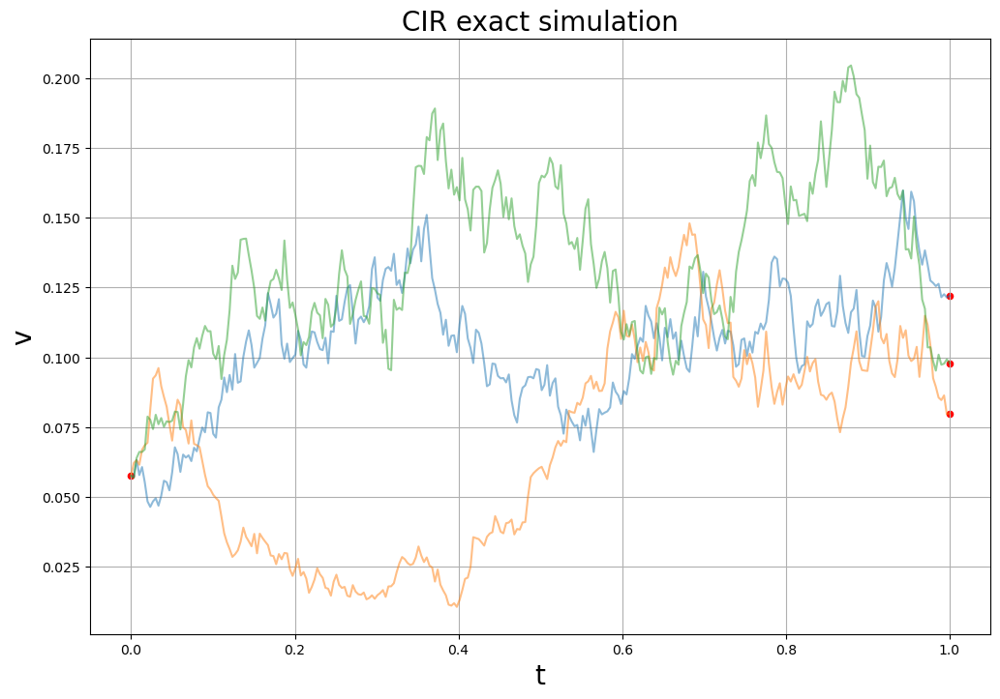

In [108]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, v[:3, :].T, alpha = 0.5)
plt.scatter(np.ones(3)*T, v[:3, -1], c = 'red', s = 20)
plt.scatter(0.0, heston_params.to_array()[-1], c  = 'red', s = 20)
plt.title('CIR exact simulation', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('v', fontsize = 20)
plt.grid()

So, simulating 300000 paths with 300 time steps takes around 4s.

Sampling from ncx2 is too expensive, so other methods for simulating CIR paths should be employed.

### QE scheme

Quadratic exponential scheme for the CIR process is based on the non-central chi-2 dist. approximation.

In order to speed up computations we employ cuda numba API.

In [22]:
### CIR MODELING

#device function to compute moments
@cuda.jit(device = True, fastmath = True)
def get_cir_moments_cuda(kappa, mean, gamma, v0, dt):
    '''
    returns E[v|v0] and Var[v|v0] of a CIR process,
    where v = v(t0 + dt), v0 = v(t0);
    '''
    c_bar = gamma**2/4/kappa*(1 - math.exp(-kappa*dt))
    kappa_bar = 4*kappa*math.exp(-kappa*dt)/gamma**2/(1 - math.exp(-kappa*dt))*v0
    df = 4*kappa*mean/gamma**2
    mu = c_bar*(df + kappa_bar)
    var = c_bar**2*(2*df + 4*kappa_bar)
    
    return mu, var

@cuda.jit(fastmath = True)
def qe_kernel(out, rng_states, kappa, mean, gamma, v0, T, N_paths, N_steps):
    dt = T/(N_steps-1)
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x

    for i in range(ii, N_paths, stride):
        out[i, 0] = v0
        for j in range(N_steps-1):
            mu, var = get_cir_moments_cuda(kappa, mean, gamma, out[i, j], dt)
            if var/mu**2 <= 1.5:
                z = xoroshiro128p_normal_float64(rng_states, ii)
                b = math.sqrt(2*mu**2/var - 1 + math.sqrt(2*mu**2/var)*math.sqrt(2*mu**2/var - 1))
                a = mu/(1 + b**2)
                out[i, j+1] =  a*(b+z)**2
            else:
                z = xoroshiro128p_uniform_float64(rng_states, ii)
                c = (var/mu**2 - 1 )/(var/mu**2 + 1)
                d = (1 - c)/mu
                out[i, j+1] = math.log((1-c)/(1-z+1e-8))/d*(z>c)

def update_cir_qe_paths(params, T, N_paths, N_steps):
    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1))//threads_per_block
    global out_cir
    global rng_states_cir

    #Memory management routine: Delete the old device array and create a new one if N_paths or N_steps were changed.
    if "out_cir" in globals() and out_cir.shape == (N_paths, N_steps):
        pass
    else:
        try:
            del out_cir, rng_states_cir
            gc.collect()
        except: pass
        out_cir = cuda.device_array((N_paths, N_steps), dtype = 'float64')
        
    rng_states_cir = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 37)
    kappa, mean, gamma, _, v0 = params
    qe_kernel[blocks_per_grid, threads_per_block](out_cir, rng_states_cir, kappa, mean, gamma, v0, T, N_paths, N_steps)

In [23]:
%%time
N_paths = 300000
N_steps = 300
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
cuda.synchronize()

CPU times: user 2.9 s, sys: 221 ms, total: 3.13 s
Wall time: 3.14 s


Using cuda-numba API allows to allocate ~500_000x500 float64 numbers in 2Gb GPU

In [66]:
##Deletes all the device arrays from memory
device_arrays = {name: var for name, var in globals().items() if isinstance(var, numba.cuda.cudadrv.devicearray.DeviceNDArray)}
for name in device_arrays.keys():
    del globals()[name]
    print(f"Deleting device array: {name}")

del device_arrays
gc.collect()

Deleting device array: rng_states_cir
Deleting device array: out_cir


1105

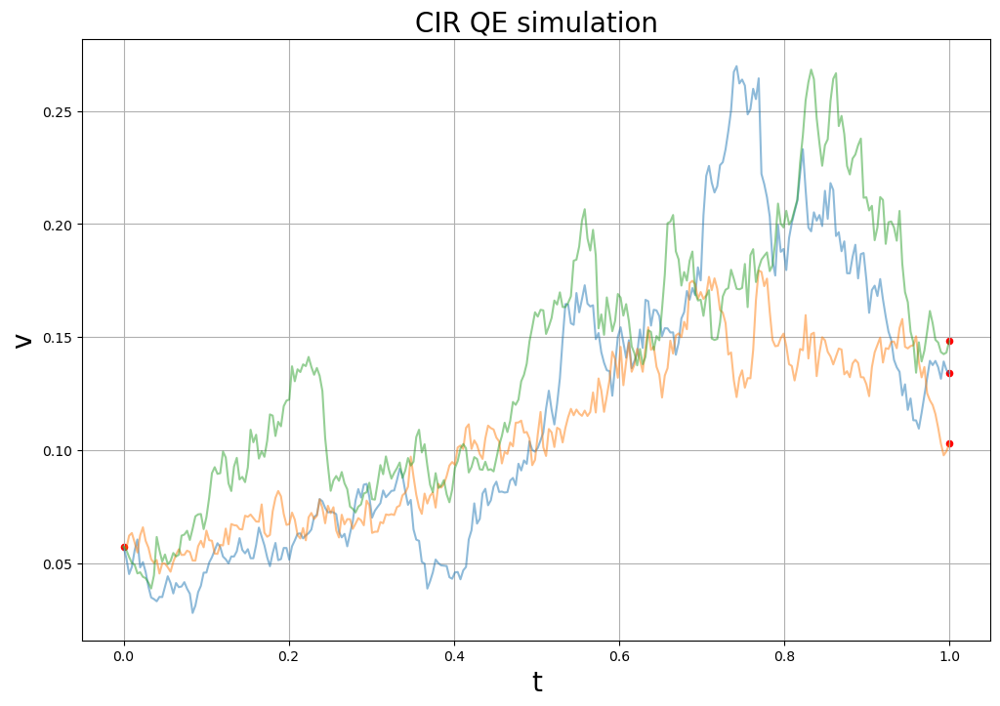

In [8]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, out_cir[:3, :].copy_to_host().T, alpha = 0.5)
plt.scatter(0.0, heston_params.to_array()[-1], c  = 'red', s = 20)
plt.scatter(np.ones(3)*T, out_cir[:3, -1].copy_to_host(), c = 'red', s = 20)
plt.title('CIR QE simulation', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('v', fontsize = 20)
plt.grid()

Using the QE scheme with CUDA acceleration sped up computations by 8x(with out moving device array to host).

### Comparison of schemes

One way to check how well does QE scheme works is to compare $v(T)$ distribution.

In [16]:
%%time
N_paths = 300000
N_steps = 300
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
cir_terminal_values = out_cir.copy_to_host()[:, -1]

CPU times: user 973 ms, sys: 149 ms, total: 1.12 s
Wall time: 1.12 s


In [17]:
%%time

#Exact dist.
tmp = get_es_cir_paths(heston_params.to_array(), T, N_paths, N_steps)
tmp = tmp[:, -1]

CPU times: user 23.5 s, sys: 637 ms, total: 24.2 s
Wall time: 3.96 s


In [18]:
print('Exact scheme mean  = ', np.mean(tmp).round(7))
print('Exact scheme variance  = ', np.var(tmp).round(7))
print('QE scheme mean  = ', np.mean(cir_terminal_values).round(7))
print('QE scheme variance  = ', np.var(cir_terminal_values).round(7))

Exact scheme mean  =  0.0831634
Exact scheme variance  =  0.0030054
QE scheme mean  =  0.083289
QE scheme variance  =  0.0030218


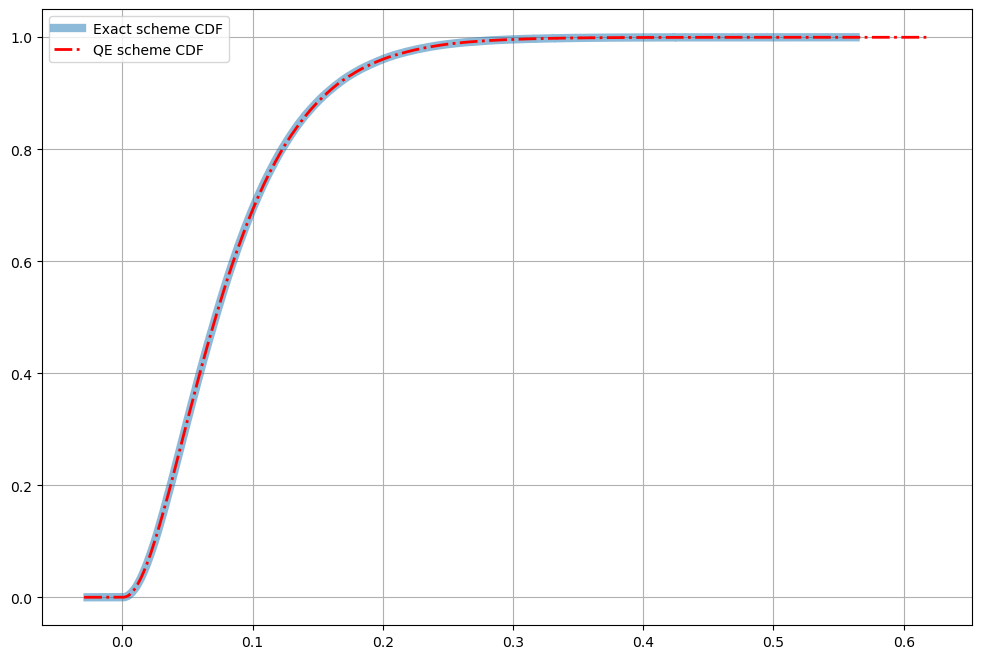

In [19]:
x = np.linspace(np.min(cir_terminal_values), np.max(cir_terminal_values), 1000)
plt.figure(figsize = (12, 8))
sp.stats.ecdf(tmp).cdf.plot(lw = 6,  label = 'Exact scheme CDF', alpha = 0.5)
sp.stats.ecdf(cir_terminal_values).cdf.plot(lw = 2, ls = '-.', c = 'red', label = 'QE scheme CDF')
plt.grid()
plt.legend()
plt.show()
plt.show()

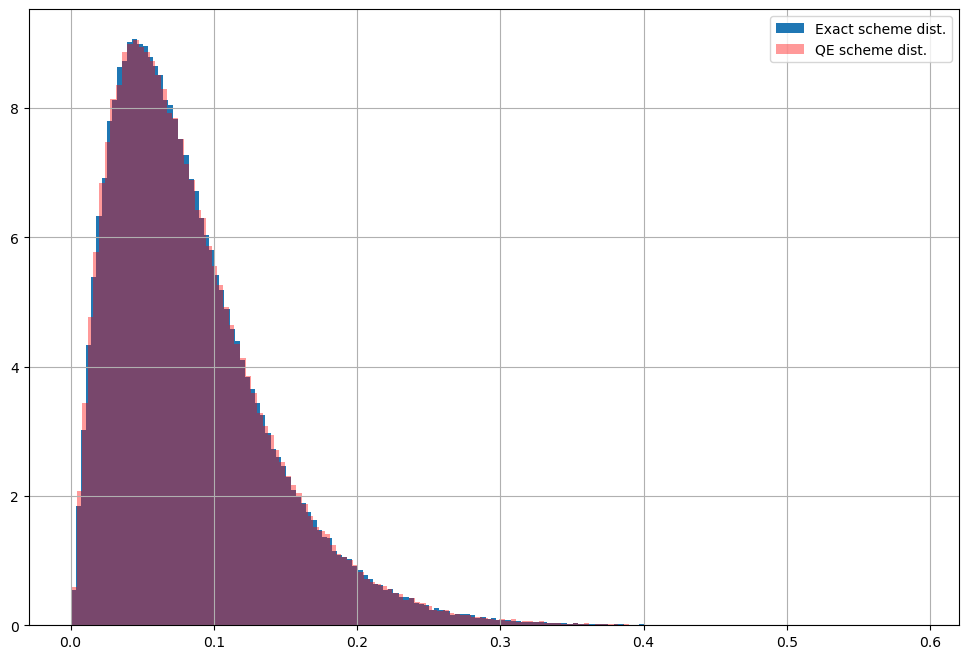

In [20]:
plt.figure(figsize = (12, 8))
plt.hist(tmp, bins = 150, density=True, label = 'Exact scheme dist.')
plt.hist(cir_terminal_values, bins = 150, density=True, alpha = 0.4, color = 'red', label = 'QE scheme dist.')
plt.grid()
plt.legend()
plt.show()
plt.show()

## Asset price simulation

Here we use scheme that is presented in Oosterlee/Grzelak book and called "almost exact simulation of the Heston model".

But instead of using exact simulation for CIR process, we use QE scheme.

In [24]:
@cuda.jit(fastmath = True)
def logprice_kernel(out, rng_states, out_cir, k0, k1, k2, k3, S, N_paths, N_steps):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x

    for i in range(ii, N_paths, stride):
        out[i, 0] = math.log(S)
        for j in range(N_steps-1):
            z = xoroshiro128p_normal_float64(rng_states, ii)
            out[i, j+1] = out[i, j] + k0 + k1*out_cir[i, j] + k2*out_cir[i, j+1] + math.sqrt(k3*out_cir[i,j] + 1e-10)*z


def update_logprice_vals(params, T, S, r, N_paths, N_steps):
    global out_logprice_val
    global rng_states_price
    global out_cir
    
    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1))//threads_per_block

    if "out_logprice_val" in globals() and out_logprice_val.shape == (N_paths, N_steps):
        pass
    else:
        try:
            del out_logprice_val, rng_states_price
            gc.collect()
        except: pass
        out_logprice_val = cuda.device_array((N_paths, N_steps), dtype = 'float64')
    rng_states_price = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 38)
    kappa, mean, gamma, rho, v0 = params
    
    dt = T/(N_steps-1)
    k0 = (r - rho/gamma*kappa*mean)*dt
    k1 = (rho/gamma*kappa - 0.5)*dt - rho/gamma
    k2 = rho/gamma
    k3 = (1 - rho**2)*dt
    logprice_kernel[blocks_per_grid, threads_per_block](out_logprice_val, rng_states_price, out_cir, k0, k1, k2, k3, S, N_paths, N_steps)

In [25]:
%%time

N_paths = 300000
N_steps = 300

#Update CIR paths -> update asset price paths
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
cuda.synchronize()

CPU times: user 1.76 s, sys: 5.9 ms, total: 1.76 s
Wall time: 1.76 s


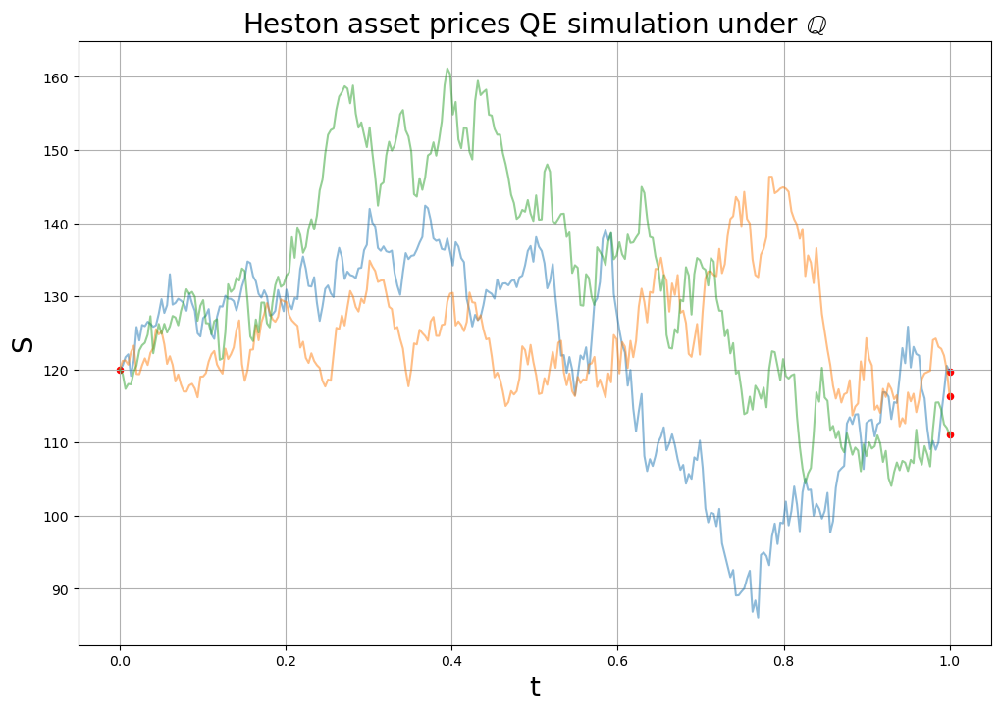

In [24]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, np.exp(out_logprice_val[:3, :].copy_to_host()).T, alpha = 0.5)
plt.scatter(0.0, S, c  = 'red', s = 20)
plt.scatter(np.ones(3)*T, np.exp(out_logprice_val[:3, -1].copy_to_host()), c = 'red', s = 20)
plt.title(r'Heston asset prices QE simulation under $\mathbb{Q}$', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('S', fontsize = 20)
plt.grid()

## Vanilla MC pricing/greeks

In [26]:
##Efficient summation for device array
@cuda.jit
def block_reduce_sum(arr, result):
    shared = cuda.shared.array(128, dtype=numba.float64) 
    tid = cuda.threadIdx.x
    i = cuda.grid(1)

    if i < arr.size:
        shared[tid] = arr[i]
    else:
        shared[tid] = 0  

    cuda.syncthreads()

    stride = 64
    while stride > 0:
        if tid < stride:
            shared[tid] += shared[tid + stride]
        stride //= 2
        cuda.syncthreads()

    if tid == 0:
        cuda.atomic.add(result, 0, shared[0])

Given simulated asset price paths under EMM, we calculate price of a European option as follows:

$V(T, S) = e^{-rT}\mathbb{E}_{\mathbb{Q}}\left[V(0, S_T)|S_0 = S \right]\approx e^{-rT} \frac{1}{N_{paths}} \sum_\limits{i = 1}^{N_{paths}}V(0, S_T^{(i)})$

$V(T, s)$ - option value, $T$ - time to maturity, $s$ - current asset price;


For options greeks we use pathwise(PW) approach for delta and finite difference(FD) method for gamma and vega.

Delta: $\Delta = \frac{\partial V}{\partial S(t_0)} = e^{-r(T-t_0)}\mathbb{E}_{\mathbb{Q}}\left[\frac{S(T)}{S(t_0)}I(S(T) > K)|\mathcal{F}(t_0) \right]$

Gamma: $\frac{\partial^2 V}{\partial S(t_0)^2} = \frac{\partial \Delta}{\partial S(t_0)} = \frac{\Delta(S(t_0) + dS) - \Delta(S(t_0) - dS)}{2dS}$ 

Vega: $\frac{\partial V}{\partial v_0} = \frac{V(v_0 + dv_0) - V(v_0 - dv_0)}{2dv_0}$

Price:

In [27]:
#Price computation
@cuda.jit(fastmath = True)
def payoff_kernel(out_logprice_val, payoffs, K, N_paths, N_steps, call = True):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x
    for i in range(ii, N_paths, stride):
        payoffs[i] = max(math.exp(out_logprice_val[i, -1]) - K, 0)*call + max(K - math.exp(out_logprice_val[i, -1]), 0)*(1 - call)

def calc_vanilla_price_mc(T, r, K, N_paths, N_steps, call = True):
    global mc_price
    global payoffs
    global out_logprice_val

    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1)) // threads_per_block
    mc_price = cuda.to_device(np.zeros(1, dtype = 'float64'))
    
    if "payoffs" in globals() and payoffs.shape == (N_paths, ):
        pass
    else:
        try:
            del payoffs
            gc.collect()
        except: pass
        payoffs = cuda.device_array(N_paths, dtype = 'float64')
    
    payoff_kernel[blocks_per_grid, threads_per_block](out_logprice_val, payoffs, K, N_paths, N_steps, call)
    block_reduce_sum[blocks_per_grid, threads_per_block](payoffs, mc_price)
    return mc_price.copy_to_host()[0]*math.exp(-r*T)/N_paths

PW Delta:

In [28]:
#Pathwise Delta
@cuda.jit(fastmath = True)
def delta_kernel(out_logprice_val, deltas_column, K, N_paths, N_steps, call = True):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x
    for i in range(ii, N_paths, stride):
        tmp = math.exp(out_logprice_val[i, -1])
        deltas_column[i] = tmp*(tmp > K)

def calc_vanilla_delta_mc(T, r, K, S, N_paths, N_steps, call = True):
    global mc_delta
    global deltas_column
    global out_logprice_val

    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1)) // threads_per_block
    mc_delta = cuda.to_device(np.zeros(1, dtype = 'float64'))
    
    if "deltas_column" in globals() and deltas_column.shape == (N_paths, ):
        pass
    else:
        try:
            del deltas_column
            gc.collect()
        except: pass
        deltas_column = cuda.device_array(N_paths, dtype = 'float64')
    
    delta_kernel[blocks_per_grid, threads_per_block](out_logprice_val, deltas_column, K, N_paths, N_steps, call)
    block_reduce_sum[blocks_per_grid, threads_per_block](deltas_column, mc_delta)
    return mc_delta.copy_to_host()[0]*math.exp(-r*T)/N_paths/S

For the calculation of FD Gamma we use PW Delta.

Finite difference Gamma/Vega:

In [29]:
def gamma_diff(params, T, r, S, K:np.array, rel):
    n = K.size
    update_cir_qe_paths(params, T, N_paths, N_steps)
    
    update_logprice_vals(params, T, S*(1+rel), r, N_paths, N_steps)
    mc_deltas_1 = np.zeros(n)
    for i in range(n):
        mc_deltas_1[i] = calc_vanilla_delta_mc(T, r, K[i], S*(1+rel), N_paths, N_steps)

    update_logprice_vals(params, T, S*(1-rel), r, N_paths, N_steps)
    mc_deltas_2 = np.zeros(n)
    for i in range(n):
        mc_deltas_2[i] = calc_vanilla_delta_mc(T, r, K[i], S*(1-rel), N_paths, N_steps)
    
    dS = S*rel
    return (mc_deltas_1 - mc_deltas_2)/2/dS


def vega_diff(params, T, r, S, K:np.array, rel):
    n = K.size
    params_1 = copy.deepcopy(params)
    params_1[-1] = params_1[-1]*( 1 + rel)

    params_2 = copy.deepcopy(params)
    params_2[-1] = params_2[-1]*( 1 - rel)
    
    update_cir_qe_paths(params_1, T, N_paths, N_steps)
    update_logprice_vals(params_1, T, S, r, N_paths, N_steps)
    mc_prices_1 = np.zeros(n)
    for i in range(n):
        mc_prices_1[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)

    update_cir_qe_paths(params_2, T, N_paths, N_steps)
    update_logprice_vals(params_2, T, S, r, N_paths, N_steps)
    mc_prices_2 = np.zeros(n)
    for i in range(n):
        mc_prices_2[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)
    dv = params[-1]*rel
    return (mc_prices_1 - mc_prices_2)/2/dv

In [30]:
%%time

N_paths = 300000
N_steps = 300

#Update CIR paths -> update asset price paths -> get option price
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
cuda.synchronize()

print('Price:', calc_vanilla_price_mc(T, r, K, N_paths, N_steps))
print('Delta:', calc_vanilla_delta_mc(T, r, K, S, N_paths, N_steps))
print('Gamma:', gamma_diff(heston_params.to_array(), T, r, S, np.array([K, K]), 0.05))
print('Vega:', vega_diff(heston_params.to_array(), T, r, S, np.array([K, K]), 0.05))

Price: 11.889776717131191
Delta: 0.6409360026699514
Gamma: [0.01441892 0.01441892]
Vega: [34.77596934 34.77596934]
CPU times: user 7.75 s, sys: 12.7 ms, total: 7.76 s
Wall time: 7.78 s


Visualization

In [31]:
## Price surface computation
NK = 100
NT = 25
K_mesh, T_mesh = np.meshgrid(np.linspace(0.5*K, 1.5*K, NK), np.linspace(0.1, 3, NT))

def mc_mesh(K_mesh, T_mesh):
    Prices = np.zeros((NT, NK))
    Deltas = np.zeros((NT, NK))
    Gammas = np.zeros((NT, NK))
    Vegas = np.zeros((NT, NK))
    for i in tqdm(np.arange(NT), desc = 'Outer loop', leave = True, position = 0, dynamic_ncols = True):
        update_cir_qe_paths(heston_params.to_array(), T_mesh[i,0], N_paths, N_steps)
        update_logprice_vals(heston_params.to_array(), T_mesh[i,0], S, r, N_paths, N_steps)
        Gammas[i, :] = gamma_diff(heston_params.to_array(), T_mesh[i, 0], r, S, K_mesh[0, :], 0.05)
        Vegas[i, :] = vega_diff(heston_params.to_array(), T_mesh[i, 0], r, S, K_mesh[0, :], 0.05)
        for j in range(NK):
            Prices[i,j] = calc_vanilla_price_mc(T_mesh[i,j], r, K_mesh[i,j], N_paths, N_steps, call = True)
            Deltas[i,j] = calc_vanilla_delta_mc(T_mesh[i, j], r, K_mesh[i,j], S, N_paths, N_steps)
    return Prices, Deltas, Gammas, Vegas     

In [32]:
%%time

Prices, Deltas, Gammas, Vegas = mc_mesh(K_mesh, T_mesh)

Outer loop: 100%|███████████████████████████████| 25/25 [03:18<00:00,  7.93s/it]

CPU times: user 3min 18s, sys: 118 ms, total: 3min 18s
Wall time: 3min 18s


In [33]:
fig = make_subplots(rows = 1, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('MC price','PW Delta','FD Gamma', 'FD Vega'),
                    horizontal_spacing = 0.001
                )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Prices, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Deltas, showscale = False), row = 1, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Gammas, showscale = False), row = 1, col = 3)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Vegas, showscale = False), row = 1, col = 4)

fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=700,
    width=1200,
    scene1 = dict(zaxis_title = 'Price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'Delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'Gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'Vega',xaxis_title = 'Strike', yaxis_title = 'Maturity')
)
fig.show()

## Vanilla COS pricing/greeks

In the Hedge part of the notebook there is a need to compute options delta, vega for each path for each timestep.
So, in order to make this task feasible we need to compute greeks and prices super fast.

In order to achieve this the COS method for pricing European otpion under Heston model is employed.

In [34]:
@njit
def ChF(kappa, mean, gamma, rho, v0, T, r, u):
    i = complex(0, 1)
    D1 = cmath.sqrt((kappa - i*rho*gamma*u)**2 + (u**2 + i*u)*gamma**2)
    g = (kappa - i*rho*gamma*u - D1)/(kappa - i*rho*gamma*u + D1)
    return cmath.exp(i*u*r*T + v0/gamma**2*(1 - cmath.exp(-D1*T))/(1 - g*cmath.exp(-D1*T))*(kappa-i*rho*gamma*u - D1))*\
        cmath.exp(kappa*mean/gamma**2*( T*(kappa - i*rho*gamma*u - D1) - 2*cmath.log((1 - g*cmath.exp(-D1*T))/(1-g))))

@njit
def Chi_k(k, c, d, a, b):
    p1 = math.cos(k*math.pi*(d-a)/(b-a))*math.exp(d)
    p2 = math.cos(k*math.pi*(c-a)/(b-a))*math.exp(c)
    p3 = k*math.pi/(b-a)*math.sin(k*math.pi*(d-a)/(b-a))*math.exp(d)
    p4 = k*math.pi/(b-a)*math.sin(k*math.pi*(c-a)/(b-a))*math.exp(c)
    return (1 + (k*math.pi/(b-a))**2)**(-1)*(p1 - p2 + p3 - p4)


@njit
def Psi_k(k, c, d, a, b):
    if k == 0:
        return d - c
    else:
        p1 = math.sin(k*math.pi*(d-a)/(b-a))
        p2 = math.sin(k*math.pi*(c-a)/(b-a))
        return (b-a)/k/math.pi*(p1-p2)

@njit
def Uk(k, a, b, call):
    return 2/(b-a)*(Chi_k(k, 0, b, a, b) - Psi_k(k, 0, b, a, b)) if call == True else 2/(b-a)*(-Chi_k(k, a, 0, a, b) + Psi_k(k, a, 0, a, b))

In [35]:
%%time
ChF(*heston_params.to_array(), T, r, 2)

CPU times: user 1.43 s, sys: 81.9 ms, total: 1.52 s
Wall time: 1.53 s


(0.8588134550725893+0.005724969957673243j)

In [36]:
@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_price_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
        res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_delta_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*(i*j*math.pi/(b-a)/S)*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_gamma_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*((i*j*math.pi/(b-a)/S)**2 - (i*j*math.pi/(b-a)/S**2))*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res 

@njit
def C_bar(kappa, mean, gamma, rho, v0, T, u):
    i = complex(0, 1)
    D1 = cmath.sqrt((kappa - i*rho*gamma*u)**2 + (u**2 + i*u)*gamma**2)
    g = (kappa - i*rho*gamma*u - D1)/(kappa - i*rho*gamma*u + D1)
    a1 = -0.5*(u**2 + i*u)
    a2 = kappa - gamma*rho*i*u
    a3 = 0.5*gamma**2
    r_ = 0.5/a3*(a2 - D1)
    return (1 - cmath.exp(-D1*T))/(1 - g*cmath.exp(-D1*T))*r_

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_vega_cos(kappa, mean, gamma, rho, v0 , T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*C_bar(kappa, mean, gamma, rho, v0, T, j*math.pi/(b-a))*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res    

In [37]:
%%time
a = -5
b = 5
N = 2000
calc_vanilla_delta_cos(*heston_params.to_array(), T, S, r, K, a, b, N, True)

CPU times: user 1.88 ms, sys: 14 μs, total: 1.89 ms
Wall time: 853 μs


0.6407646995788587

In [38]:
%%time

NK = 100
NT = 25
K_mesh, T_mesh = np.meshgrid(np.linspace(0.5*K, 1.5*K, NK), np.linspace(0.1, 3, NT))

price_cos = calc_vanilla_price_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
delta_cos = calc_vanilla_delta_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
gamma_cos = calc_vanilla_gamma_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
vega_cos = calc_vanilla_vega_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)

CPU times: user 13.1 s, sys: 10.9 ms, total: 13.1 s
Wall time: 1.82 s


In [39]:
fig = make_subplots(rows = 1, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('COS Price','COS Delta','COS Gamma', 'COS Vega'),
                    horizontal_spacing = 0.001
                )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = price_cos, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = delta_cos, showscale = False), row = 1, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = gamma_cos, showscale = False), row = 1, col = 3)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = vega_cos, showscale = False), row = 1, col = 4)

fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=700,
    width=1200,
    scene1 = dict(zaxis_title = 'Price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'Delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'Gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'Vega',xaxis_title = 'Strike', yaxis_title = 'Maturity')
)
fig.show()

## Hedging

For the Heston model with correlated EMM BM we have:

$dV = (\frac{\partial V}{\partial t} + rS\frac{\partial V}{\partial S} + \kappa(\bar{v} - v)\frac{\partial V}{\partial v} + \frac{1}{2}vS^2\frac{\partial^2 V}{\partial S^2} + \rho \gamma S v\frac{\partial^2 V}{\partial S \partial v} + \frac{1}{2}\gamma^2 s \frac{\partial^2 V}{\partial v^2})dt + S\sqrt{v}\frac{\partial V}{\partial S}dW_{S} + \gamma \sqrt{v}\frac{\partial V}{\partial v}dW_{v}$


So, let's construct portfolio consisting of the options $V_{0}, V_{1}$ on the same underlying with the same time to expiration but with different strikes.

$V(T, S)$ - theoretical price of a call option with $T - \;$ time to maturity and $S - \;$ current asset price.

**Delta hedge:**

We sell an option and buy $\delta_s(0)$ amount of stock. Then:

$\Pi(0) = V(T, S_0) - \delta_s(0) S_0$ - Initial value of a portfolio.

$PnL(t) = \Pi(t) - V(T-t, S)$

At time $t$ values of a portfolio is $\Pi(t) = -V(T-t, S) - \delta_s(t) S(t) + \Pi(0)$

We take  $\delta_s = \frac{\partial V}{\partial S}$

**Delta-Sigma hedge:**

Now we sell an option, buy $\delta_s(0)$ amount of stock, and buy $\delta_{V_1}$ amount of another call option with $(K_1, T_1)$ on the same underlying.
Then:

$\Pi(0) = V(T, S_0) - \delta_s(0) S_0 - \delta_{V_1}(0)V_1(T_1, S, K_1)$ - Initial value of a portfolio.

Where: $\delta_{V_1} = \frac{\partial V}{\partial v} / \frac{\partial V_1}{\partial v}$ 

$\delta_{s} = \frac{\partial V}{\partial S} - \delta_{V_1}\frac{\partial V_1}{\partial S}$ 

In [84]:
S = 100.0
T = 2.0
K = 100.0
r = 0.03

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

N_paths = 10000
N_steps = 365
t = np.linspace(0, T, N_steps)
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)


# in order to simplify implementation we can choose rebalancing time interval devisible by T/(N_steps-1)
dt = T/(N_steps-1)

In [85]:
a = -5.0
b = 5.0
N = 300

In [86]:
%%time
N_ = N
price_paths = np.exp(out_logprice_val.copy_to_host())
option_price_paths_0 = calc_vanilla_price_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)
print('**********')
option_delta_paths_0 = calc_vanilla_delta_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)
option_delta_paths_0 = np.where(option_delta_paths_0 > 1.0, 1.0, option_delta_paths_0) #Correction related to COS method as it can 
option_delta_paths_0 = np.where(option_delta_paths_0 < 0.0, 0.0, option_delta_paths_0)
print('**********')
option_vega_paths_0 = calc_vanilla_vega_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)

**********
**********
CPU times: user 36min 12s, sys: 2.14 s, total: 36min 14s
Wall time: 4min 44s


In [87]:
%%time
#We also need another two options H1 and H2
K1 = 110.0
T1 = 3
N_ = N
option_price_paths_1 = calc_vanilla_price_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)
print('**********')
option_delta_paths_1 = calc_vanilla_delta_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)
option_delta_paths_1 = np.where(option_delta_paths_1 > 1.0, 1.0, option_delta_paths_1)
option_delta_paths_1 = np.where(option_delta_paths_1 < 0.0, 0.0, option_delta_paths_1)
print('**********')
option_vega_paths_1 = calc_vanilla_vega_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)

**********
**********
CPU times: user 36min 48s, sys: 1.77 s, total: 36min 50s
Wall time: 4min 43s


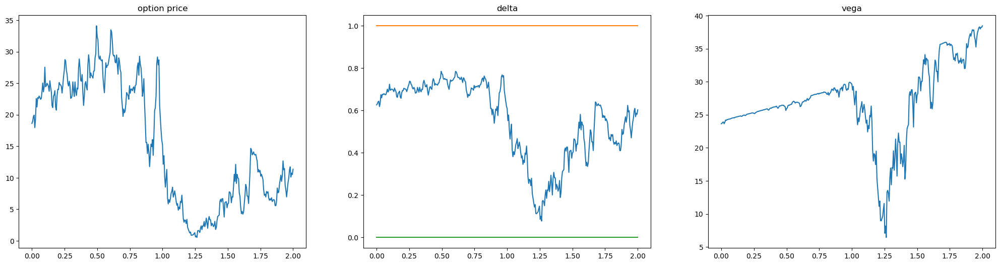

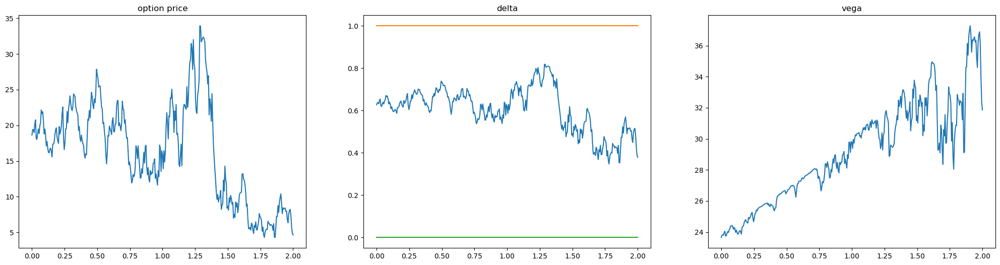

In [88]:
for i in range(2):
    fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (25, 6))
    axs[0].set_title('option price')
    axs[1].set_title('delta')
    axs[2].set_title('vega')
    axs[0].plot(t, option_price_paths_1[i, :])
    axs[1].plot(t, option_delta_paths_1[i, :])
    axs[1].plot([t[0], t[-1]], [1, 1])
    axs[1].plot([t[0], t[-1]], [0, 0])
    axs[2].plot(t, option_vega_paths_1[i, :])
    plt.show()

In [89]:
#Delta
def delta_hedge(k):
    m = int(T//(k*dt))
    rebalance_times = np.linspace(0, m*k*dt, m+1)
    pnl = np.zeros((N_paths, m+1+1))
    pnl[:, 0] = option_price_paths_0[:, 0] - option_delta_paths_0[:, 0]*price_paths[:, 0]
    for i in range(1, m+1):
        pnl[:, i] = pnl[:, i-1]*np.exp(r*k*dt) - (option_delta_paths_0[:, i*k] - option_delta_paths_0[:, k*(i-1)])*price_paths[:, k*i]
    pnl[:, m+1] = pnl[:, m]*np.exp(r*(T-rebalance_times[-1])) - option_price_paths_0[:, -1] + option_delta_paths_0[:, i*k]*price_paths[:, -1]
    return pnl, pnl[:, -1].mean(), pnl[:, -1].var()

def delta_sigma_hedge(k):
    m = int(T//(k*dt))
    rebalance_times = np.linspace(0, m*k*dt, m+1) #include everything but the last point T
    pnl = np.zeros((N_paths, m+1+1))
    tmp2 = option_vega_paths_0/option_vega_paths_1
    tmp1 = option_delta_paths_0 - tmp2*option_delta_paths_1
    pnl[:, 0] = option_price_paths_0[:, 0] - tmp1[:, 0]*price_paths[:, 0] - tmp2[:, 0]*option_price_paths_1[:, 0]

    for i in range(1, m+1):
        pnl[:, i] = pnl[:, i-1]*np.exp(r*k*dt) - (tmp1[:, k*i] - tmp1[:, k*(i-1)])*price_paths[:, k*i] - (tmp2[:, k*i] - tmp2[:, k*(i-1)])*option_price_paths_1[:, k*i]
    pnl[:, m+1] = pnl[:, m]*np.exp(r*(T - rebalance_times[-1])) - option_price_paths_0[:, -1] + tmp1[:, k*i]*price_paths[:, -1] + \
    tmp2[:, k*i]*option_price_paths_1[:, -1]
    return pnl, pnl[:, -1].mean(), pnl[:, -1].var()

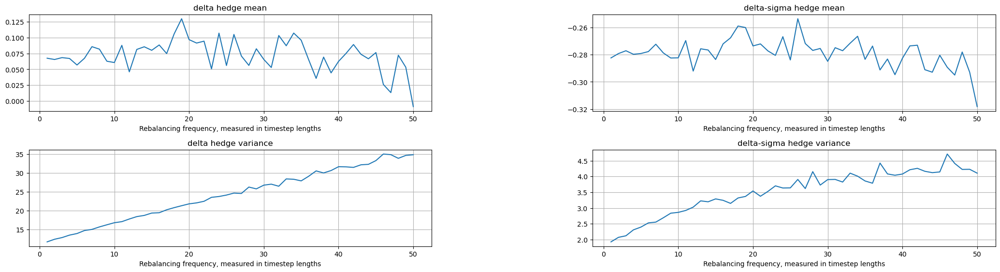

In [109]:
fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (25, 6))
tmp = {0:'delta hedge', 1:'delta-sigma hedge'}
for i, method in enumerate([delta_hedge, delta_sigma_hedge]):
    axs[0, i].set_title(tmp[i] + ' mean')
    axs[1, i].set_title(tmp[i] + ' variance')
    k_max = 50
    mean = np.zeros(k_max)
    var = np.zeros(k_max)
    for k in range(1, k_max+1):
        _, mean[k-1], var[k-1] = method(k)
    axs[0, i].plot(np.arange(1, k_max+1), mean)
    axs[1, i].plot(np.arange(1, k_max+1), var)

for ax in axs.flat:
    ax.grid()
    ax.set_xlabel('Rebalancing frequency, measured in timestep lengths')

plt.subplots_adjust(
    left=0.1,    # left side of subplots
    right=0.9,   # right side of subplots
    bottom=0.1,  # bottom of subplots
    top=0.9,     # top of subplots
    wspace=0.4,  # horizontal space between subplots
    hspace=0.4   # vertical space between subplots
)

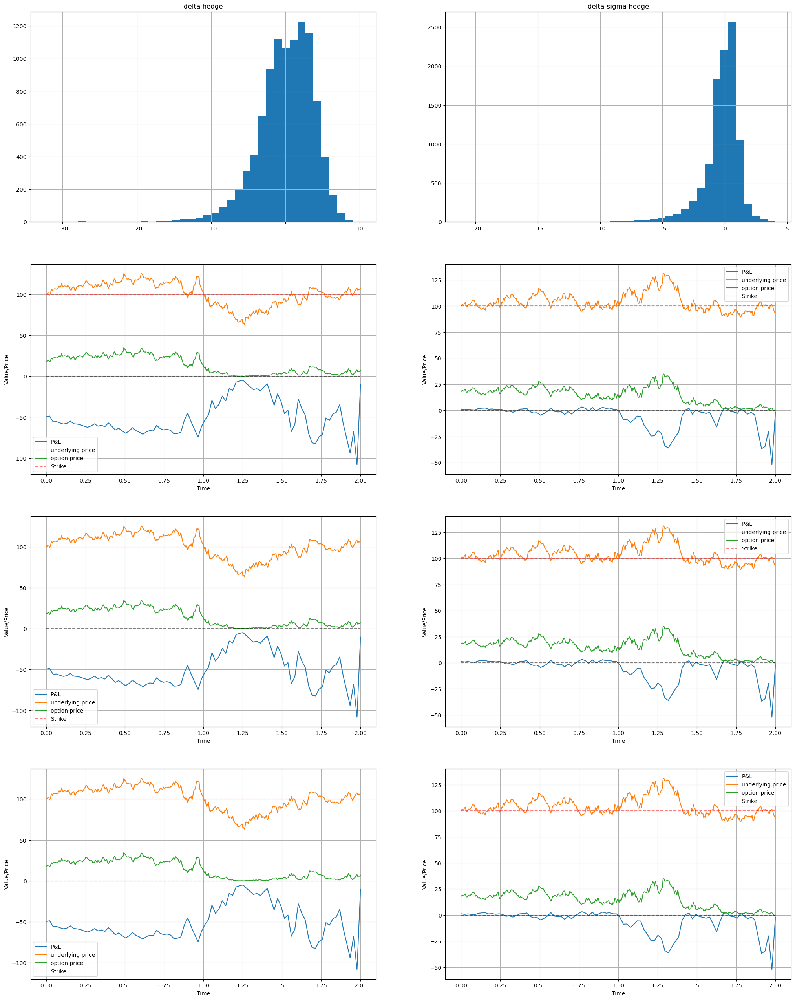

In [131]:
tmp = {0:'delta hedge', 1:'delta-sigma hedge'}
k = 4
m = int(T//(k*dt))
rebalance_times = np.linspace(0, m*k*dt, m+1)
time = np.concatenate((rebalance_times, np.array(T).reshape(1, )))
n_exhibits = 3

fig,axs = plt.subplots(nrows = 1+n_exhibits, ncols = 2, figsize = (25, 8*(1+n_exhibits)))

for i, method in enumerate([delta_hedge, delta_sigma_hedge]):
    pnl, mean, var = method(k)
    axs[0, i].hist(pnl[:, -1], bins = 40)
    axs[0, i].set_title(tmp[i])
    axs[0, i].grid()

    for p in range(1, n_exhibits+1):
        axs[p, i].plot(time, pnl[i, :], label = "P&L")
        axs[p, i].plot(t, price_paths[i, :], label = 'underlying price')
        axs[p, i].plot(t, option_price_paths_0[i, :], label = 'option price')
        axs[p, i].plot([t[0], t[-1]], [K, K], label = 'Strike', c = 'red', alpha = 0.5, ls = '--')
        axs[p, i].plot([t[0], t[-1]], [0.0, 0.0], c = 'black', alpha = 0.5, ls = '--')
        axs[p, i].legend()
        axs[p, i].set_xlabel('Time')
        axs[p, i].set_ylabel('Value/Price')
        axs[p, i].grid()

One could observe that delta-sigma hedge has lower terminal pnl variance, that is due to total instantaneous variance elimination of the delta-sigma hedge(due to finite number of rebalancing dates there still will be some variance).

# JAX Heston model implementation

The purpose of this part is just to use autograd magic for Greeks computation.

And the reason for not using JAX for the previous part is that it requires much more GPU memory than cuda-numba for simulating and storing the same amount of paths/steps(i.e. computation of greeks with meaningful number of paths would be impossible on my 2GB GPU)

The implementation follows the same logic, but here we do not store all asset price values, only the terminal values, since price paths are not required for european option pricing and also for GPU memory/efficiency reasons.

Model parameters:

In [4]:
S = 100.0
T = 1.0
K = 100.0
r = 0.03

key = jax.random.key(37)

In [5]:
@dataclass
class HestonParams:
    kappa: float 
    mean: float
    gamma: float
    rho:float
    v0:float

    def to_array(self):
        return np.array([self.kappa, self.mean, self.gamma, self.rho, self.v0])

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

Implementation of QE scheme and Heston model discretization in a jax.lax.scan compatible form:

In [6]:
@jax.jit
def get_next_cir_value(kappa, mean, gamma, rho, v0, v_prev, dt, z1, z2):
    c_bar = gamma**2/4/kappa*(1 - jnp.exp(-kappa*dt))
    kappa_bar = 4*kappa*jnp.exp(-kappa*dt)/gamma**2/(1 - jnp.exp(-kappa*dt))*v_prev
    df = 4*kappa*mean/gamma**2
    mu = c_bar*(df + kappa_bar)
    var = c_bar**2*(2*df + 4*kappa_bar)
    b = jnp.sqrt(2*mu**2/var - 1 + jnp.sqrt(2*mu**2/var)*jnp.sqrt(2*mu**2/var - 1))
    a = mu/(1 + b**2)
    c = (var/mu**2 - 1 )/(var/mu**2 + 1)
    d = (1 - c)/mu
    flag = var/mu**2 <= 1.5
    return a*(b+z1)**2*flag + jnp.log((1-c)/(1-z2+1e-8))/d*(z2>c)*(1-flag)

@jax.jit
def get_next_logprice_value(kappa, mean, gamma, rho, v0, T, s_prev, r, v_prev, v_curr, dt, z3):
    k0 = (r - rho/gamma*kappa*mean)*dt
    k1 = (rho/gamma*kappa - 0.5)*dt - rho/gamma
    k2 = rho/gamma
    k3 = (1 - rho**2)*dt
    return s_prev + k0 + k1*v_prev + k2*v_curr + jnp.sqrt(k3*v_prev)*z3

In [8]:
%%time

#dummy parameters values, for testing
get_next_cir_value(*heston_params.to_array(), 0.05, 0.1, 0.1, 0.1)
get_next_logprice_value(*heston_params.to_array(), T, math.log(S), r, 0.05, 0.05*(1+0.1), 0.01, 0.1)

CPU times: user 6.38 ms, sys: 114 μs, total: 6.49 ms
Wall time: 4 ms


Array(4.6000237, dtype=float32)

Computation of terminal asset prices:

In [9]:
def get_terminal_logprices(kappa, mean, gamma, rho, v0, T, S, r, N_paths, N_steps, key):
    dt = T/(N_steps-1)

    def step(carry, key):
        v_prev, s_prev = carry
        key1, key2, key3 = jax.random.split(key, 3)
        z1 = jax.random.normal(key1, (N_paths,)) 
        z2 = jax.random.uniform(key2, (N_paths,))
        z3 = jax.random.normal(key3, (N_paths,)) 
        
        v_next = get_next_cir_value(kappa, mean, gamma, rho, v0, v_prev, dt, z1, z2)
        s_next = get_next_logprice_value(kappa, mean, gamma, rho, v0, T, s_prev, r, v_prev, v_next, dt, z3)
        return (v_next, s_next), s_next

    keys = jax.random.split(key, N_steps-1)
    v_init = jnp.full(N_paths, v0)
    s_init = jnp.full(N_paths, jnp.log(S))
    (_, terminal_logprices), _ = jax.lax.scan(step, (v_init, s_init), keys) 
    
    return terminal_logprices

get_terminal_logprices = jax.jit(get_terminal_logprices, static_argnums=(8, 9))

In [11]:
%%time

N_paths = 300000
N_steps = 300
terminal_logprices = get_terminal_logprices(*heston_params.to_array(), T, S, r, N_paths, N_steps, key)

CPU times: user 107 ms, sys: 3.88 ms, total: 111 ms
Wall time: 109 ms


Given terminal asset prices we can price the derivative.

To being able to compute second order greeks, such as gamma, we need a differentiable payoff. To achive this we approximate european payoff in a following way: 

$\text{payoff(S)} \approx \frac{\ln(1+e^{\omega(S-K)})}{\omega}$, where $\omega$ - smoothness parameter(lower $\omega$  equals higher smoothness).

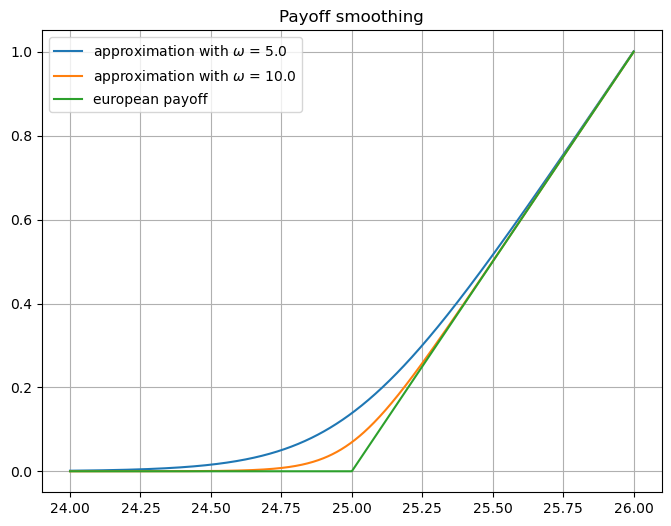

In [12]:
x = np.linspace(24, 26, 1000)
w1 = 5.0
w2 = 10.0
K_ = 25

plt.figure(figsize = (8, 6))
plt.plot(x, np.log(1 + np.exp(w1*(x- K_)))/w1, label = f'approximation with $\\omega$ = {w1}')
plt.plot(x, np.log(1 + np.exp(w2*(x- K_)))/w2, label = f'approximation with $\\omega$ = {w2}')
plt.plot(x, np.maximum(0, x-K_), label = 'european payoff')
plt.grid()
plt.title('Payoff smoothing')
plt.legend()
plt.show()

In [13]:
@jax.jit
def payoff(K, r, T, logprice, smoothness = 10.0):
    return jnp.exp(-r*T)*jnp.mean(jax.nn.softplus(smoothness * (jnp.exp(logprice) - K)) / smoothness)

def calc_mc_price(kappa, mean, gamma, rho, v0, K, T, S, r, N_paths, N_steps, key):
    logprice = get_terminal_logprices(kappa, mean, gamma, rho, v0, T, S, r, N_paths, N_steps, key)
    return payoff(K, r, T, logprice)

calc_mc_price = jax.jit(calc_mc_price, static_argnums=(9, 10))

In [14]:
delta_ = jax.grad(calc_mc_price, argnums=7)
gamma_ = jax.grad(delta_, argnums=7)
vega_ = jax.jacfwd(calc_mc_price, argnums=4)

price_delta = jax.value_and_grad(calc_mc_price, argnums=7)

In [16]:
%%time
price_1, delta_1 = price_delta(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)
gamma_1 = gamma_(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)
vega_1 = vega_(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)


print("Price:", price_1)
print("Delta:", delta_1)
print("Gamma:", gamma_1)
print("Vega:", vega_1)

Price: 11.885308
Delta: 0.6402
Gamma: 0.014523057
Vega: 34.94537
CPU times: user 376 ms, sys: 15.9 ms, total: 392 ms
Wall time: 406 ms


Surfaces computation:

In [17]:
NK = 20
NT = 20
K_mesh, T_mesh = np.meshgrid(np.linspace(0.5*K, 1.5*K, NK), np.linspace(0.1, 3, NT))


def mc_mesh(K_mesh, T_mesh):
    Prices = jnp.zeros((NT, NK))
    Deltas = jnp.zeros((NT, NK))
    Gammas = jnp.zeros((NT, NK))
    Vegas = jnp.zeros((NT, NK))
    for i in tqdm(np.arange(NT), desc = 'Outer loop', leave = True, position = 0, dynamic_ncols = True):
        for j in np.arange(NK):
            price_tmp, delta_tmp = price_delta(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key)
            Prices = Prices.at[i,j].set(price_tmp)
            Deltas = Deltas.at[i,j].set(delta_tmp)
            Gammas = Gammas.at[i,j].set(gamma_(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
            Vegas = Vegas.at[i,j].set(vega_(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
    return Prices, Deltas, Gammas, Vegas

In [18]:
%%time
prices, deltas, gammas, vegas = mc_mesh(K_mesh, T_mesh)

Outer loop: 100%|███████████████████████████████| 20/20 [02:36<00:00,  7.84s/it]

CPU times: user 2min 37s, sys: 3.08 s, total: 2min 40s
Wall time: 2min 36s


In [19]:
fig = make_subplots(rows = 1, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('Price','Delta','Gamma','Vega'),
                    horizontal_spacing = 0.001
                )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = prices, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = deltas, showscale = False), row = 1, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = gammas, showscale = False), row = 1, col = 3)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = vegas, showscale = False), row = 1, col = 4)

fig.update_layout(
    height=600,
    width=1500,
    scene1 = dict(zaxis_title = 'Price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'Delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'Gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'Vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    
)
fig.show()

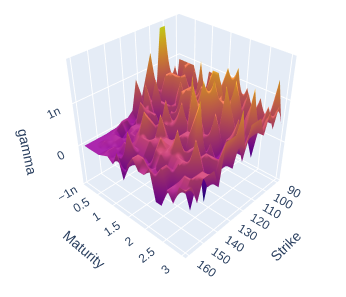 - options "Gamma" without smoothing. 

First order Greeks does not have any problem being computed without smooth payofff.

# American option pricing

The value of an american option is the value achieved by exercising optimally.


$m$ - number of time steps, $N$ - number of MC paths, $V_{i}$ - value at $i$ time step, $h(x)$ - payoff function; 

Formulation of the problem in dynamic-programming sense:

$V_{m}(x) = h(x)$ - value at maturity

$V_i(x) = max\{h(x), C_i(x)\}$, $i = 0,..., m-1$

Where $C_{i}(x) = \mathbb{E}_Q \left[V_{i+1}(x_{i+1})|x_{i}= x\right ] $ - Continuation value - value of holding rather than exercising;



We are interested in $V_0(x_0)$

In LSMC we approximate continuation value by linear combination of basis functions:


$$ C_i(x) = \sum_{k=0}^{d_1} \sum_{p=0}^{d_2} w_{kp} \, \phi_k(x_{1i}) \phi_p(x_{2i}) $$

Here $x^{i}_j = (x_{1i}, x_{2i})$, $x_{1i} - $ underlying price, $x_{2i} - $ volatility;

Our basis functions of choice are Chebyshev polynomials of the first kind. They are orthogonal on $[-1, 1]$, so the predictor scaling should be done.

Eventually we are solving the following least squares problem at each time step $i$:

$$ V_{i+1} = A(x_i)w = 
\left[
\begin{array}{cccc}
\phi_0(x_{1i}^1)\phi_0(x_{2i}^1) & \phi_0(x_{1i}^1)\phi_1(x_{2i}^1) & \cdots & \phi_{d_1}(x_{1i}^1)\phi_{d_2}(x_{2i}^1) \\
\phi_0(x_{1i}^2)\phi_0(x_{2i}^2) & \phi_0(x_{1i}^2)\phi_1(x_{2i}^2) & \cdots & \phi_{d_1}(x_{1i}^2)\phi_{d_2}(x_{2i}^2) \\
\vdots & \vdots & \ddots & \vdots \\
\phi_0(x_{1i}^N)\phi_0(x_{2i}^N) & \cdots & \cdots & \phi_{d_1}(x_{1i}^N)\phi_{d_2}(x_{2i}^N)
\end{array}
\right]
\left[
\begin{array}{c}
w_{00} \\ w_{01} \\ \vdots \\ w_{0d_2} \\ w_{10} \\ w_{11} \\ \vdots \\ w_{d_1d_2}
\end{array}
\right] $$



Unlike original approach we take only those paths which discounted values at the next time step are positive.

Parameters:

In [312]:
S = 40
T = 2.0
K = 40
r = 0.06


heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.04
)

N_paths = 30000
N_steps = 1000
dt = T/(N_steps - 1)
discount = np.exp(-dt*r)
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)

asset_prices = np.exp(out_logprice_val)
volatility = np.sqrt(out_cir)
payoff = lambda s: np.maximum(0, s-K)
option_values = np.zeros((N_paths, N_steps))
option_values[:, -1] = payoff(asset_prices[:, -1])

Basis functions and design matrix:

In [212]:
@njit
def chebyshev(x, d):
    
    n = x.size
    result = np.zeros((n, d + 1))
    
    # T_0(x) = 1
    result[:, 0] = 1.0
    
    if d == 0:
        return result
    
    # T_1(x) = x
    result[:, 1] = x
    
    if d == 1:
        return result
    
    # Recurrence relation: T_n(x) = 2x * T_{n-1}(x) - T_{n-2}(x)
    for i in range(2, d + 1):
        result[:, i] = 2 * x * result[:, i - 1] - result[:, i - 2]
    
    return result

@njit
def A_matrix(x1, x2, d1, d2):
    basis_1 = chebyshev(x1, d1)
    basis_2 = chebyshev(x2, d2)

    design_matrix = np.zeros((x1.size, (d1+1)*(d2+1)))
    for i in range(x1.size):
        design_matrix[i, :] = np.outer(basis_1[i, :], basis_2[i, :]).flatten()
        
    return design_matrix

Illustration of the algo:

In [313]:
X1 = asset_prices[:, -2]
X2 = volatility[:, -2]

X1_scaled = 2*(X1 - X1.min())/(X1.max() - X1.min()) - 1 
X2_scaled = 2*(X2 - X2.min())/(X2.max() - X2.min()) - 1 
V = discount*payoff(asset_prices[:, -1])

idx = np.where(V > 0.0)[0]

In [314]:
d1 = 1
d2 = 0
A = A_matrix(X1_scaled, X2_scaled, d1, d2)

coef = np.linalg.lstsq(A[idx], V[idx])[0]
V_hat = np.matmul(A, coef)

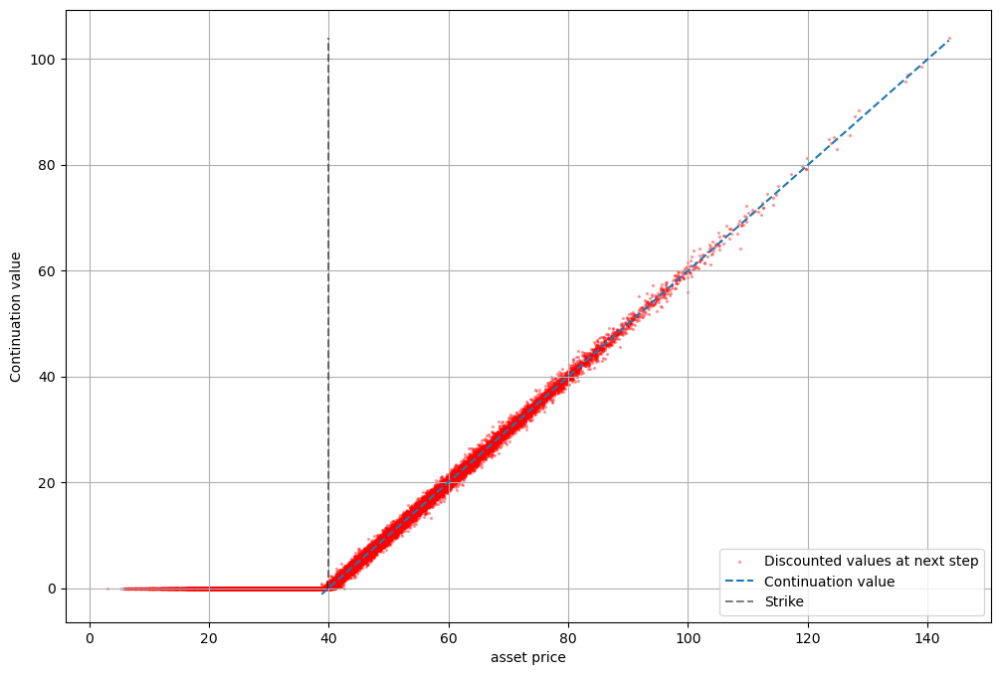

In [315]:
plt.figure(figsize = (12, 8))
plt.scatter(X1, V, c = 'red', s = 2, alpha = 0.3, label = 'Discounted values at next step')
plt.plot(X1[idx][np.argsort(X1[idx])], V_hat[idx][np.argsort(X1[idx])], ls = '--', label = 'Continuation value')
plt.plot([K, K], [0, np.max(V)], alpha = 0.5, c = 'black', ls = '--', label = 'Strike')
plt.xlabel('asset price')
plt.ylabel('Continuation value')
plt.legend()
plt.grid()

Pricing and comparison with European option for the list of current asset prices:

In [316]:
american_values = list()
european_values = list()
S_list = np.linspace(K*0.5, K*1.5, 30)
for S in S_list:
    update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
    asset_prices = np.exp(out_logprice_val)
    option_values = np.zeros((N_paths, N_steps))
    option_values[:, -1] = payoff(asset_prices[:, -1])


    for j in range(N_steps-2, 0, -1):
        X1, X2, V = asset_prices[:, j], volatility[:, j], discount*option_values[:, j+1]
        idx = np.where(V > 0)[0]
        X1_scaled = 2*(X1 - X1.min())/(X1.max() - X1.min()) - 1 
        X2_scaled = 2*(X2 - X2.min())/(X2.max() - X2.min()) - 1
    
        d1 = 2
        d2 = 1
        A = A_matrix(X1_scaled, X2_scaled, d1, d2)
        coef = np.linalg.lstsq(A[idx], V[idx])[0]
        
        cont = np.matmul(A, coef)
        option_values[:, j] = np.where(payoff(X1) >= cont + 1e-6, payoff(X1), cont)


    american_values.append(discount*np.mean(option_values[:,1]))
    european_values.append(calc_vanilla_price_cos(*heston_params.to_array(), T, S, r, K, a, b, N, True))

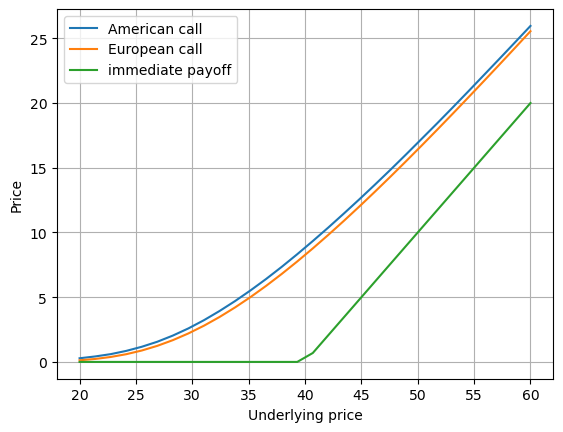

In [317]:
plt.plot(S_list, american_values, label = 'American call')
plt.plot(S_list, european_values, label = 'European call')
plt.plot(S_list, payoff(S_list), label = 'immediate payoff')
plt.xlabel('Underlying price')
plt.ylabel('Price')
plt.grid()
plt.legend()
plt.show()

Strike = 40, Time to maturity = 2;

As expected price of American option is higher for any underlying price(due to possibility of early exercise).

# IR models

Here are just some basics of IR modeling.

$R(t, T) = -\frac{\ln P(t, T)}{T-t} \Rightarrow P(t, T) = e^{-R(t, T)(T-t)}$, where $R(t, T) - \text{ZCYC}$, 
$P(t, T) - \text{ZCB};$

To make $R(t, T) $ and $P(t, T)$ - continuous and differentiable we interpolate them with cubic splines.

$f(0, T) = \frac{\partial R(0, T)}{\partial T}T + R(0, T)$ - forward rate

In [38]:
#Deepseek realization of scipy.interpolate.CubicSpline using JAX
#Produce almost the same result as scipy
def create_cubic_spline_interpolator(x_data, y_data, bc_type='not-a-knot'):
    x_data = jnp.asarray(x_data)
    y_data = jnp.asarray(y_data)
    n = x_data.shape[0]
    h = x_data[1:] - x_data[:-1]
    delta = (y_data[1:] - y_data[:-1]) / h

    # Build tridiagonal system for not-a-knot boundary conditions
    if bc_type == 'not-a-knot':
        A = jnp.zeros((n, n))
        rhs = jnp.zeros(n)
        A = A.at[0, 0].set(h[1])
        A = A.at[0, 1].set(-(h[0] + h[1]))
        A = A.at[0, 2].set(h[0])
        A = A.at[-1, -3].set(h[-2])
        A = A.at[-1, -2].set(-(h[-2] + h[-1]))
        A = A.at[-1, -1].set(h[-1])
        for i in range(1, n-1):
            A = A.at[i, i-1].set(h[i-1])
            A = A.at[i, i].set(2*(h[i-1] + h[i]))
            A = A.at[i, i+1].set(h[i])
            rhs = rhs.at[i].set(6*(delta[i] - delta[i-1]))
    else:  # Natural
        A = jnp.zeros((n-2, n-2))
        rhs = jnp.zeros(n-2)
        for i in range(n-2):
            if i > 0:
                A = A.at[i, i-1].set(h[i])
            A = A.at[i, i].set(2*(h[i] + h[i+1]))
            if i < n-3:
                A = A.at[i, i+1].set(h[i+1])
            rhs = rhs.at[i].set(6*(delta[i+1] - delta[i]))
        mu_inner = jnp.linalg.solve(A, rhs)
        mu = jnp.concatenate([jnp.zeros(1), mu_inner, jnp.zeros(1)])

    # Solve for mu (second derivatives)
    mu = jnp.linalg.solve(A, rhs) if bc_type == 'not-a-knot' else mu

    # Compute coefficients (same as before)
    a = y_data[:-1]
    b = delta - h*(2*mu[:-1] + mu[1:])/6
    c = mu[:-1]/2
    d = (mu[1:] - mu[:-1])/(6*h)

    @jax.jit
    def interpolate(x):
        idx = jnp.clip(jnp.searchsorted(x_data, x) - 1, 0, n-2)
        dx = x - x_data[idx]
        return a[idx] + dx*(b[idx] + dx*(c[idx] + dx*d[idx]))

    return interpolate

<Figure size 1200x800 with 0 Axes>

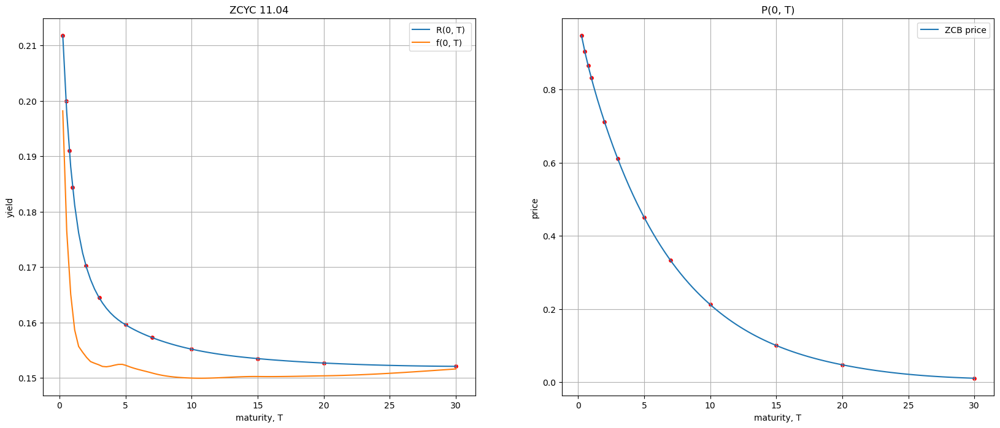

In [39]:
#Data from MOEX ZCYC
maturities = jnp.array([0.25, 0.5, 0.75, 1, 2, 3, 5, 7, 10, 15, 20, 30])
yields = jnp.array([21.18, 19.99, 19.1, 18.44, 17.03, 16.45, 15.96, 15.73, 15.52, 15.35, 15.27, 15.21]) / 100

#Interpolating using cubic splines; Derivatives declaration
R_spline = create_cubic_spline_interpolator(maturities, yields)
R_spline_der = jax.grad(R_spline)
R_spline_2der = jax.grad(jax.grad(R_spline))
P_spline = create_cubic_spline_interpolator(maturities, jnp.exp(-yields*maturities))
min_maturities, max_maturities = jnp.min(maturities), jnp.max(maturities)
x = jnp.linspace(min_maturities, max_maturities, 100)

#Plotting
plt.figure(figsize = (12, 8))
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 8))
axs[0].plot(x, R_spline(x), label = 'R(0, T) ')
axs[0].plot(x, jax.vmap(R_spline_der)(x)*x + R_spline(x), label = 'f(0, T)')
axs[0].scatter(maturities, yields, s = 15, c = 'red')
axs[0].set_xlabel('maturity, T')
axs[0].set_ylabel('yield')
axs[0].set_title('ZCYC 11.04')

axs[1].plot(x, P_spline(x), label = 'ZCB price')
axs[1].scatter(maturities, jnp.exp(-yields*maturities), s = 15, c = 'red')
axs[1].set_xlabel('maturity, T')
axs[1].set_ylabel('price')
axs[1].set_title('P(0, T)')

for ax in axs:
    ax.grid()
    ax.legend()

Next, to model short rate we use Hull-White model:

$dr(t) = \lambda(\theta(t) - r(t))dt + \eta dW(t)$ - model specification under EMM;

In this model we can calibrate $\theta(t)$ to market data using market prices of ZCB:

$\theta(t) = f(0, t) + \frac{1}{\lambda}\frac{\partial f(0, t)}{\partial t} + \frac{\eta^2}{2 \lambda^2}(1 - e^{-2\lambda t})$, where $f(0, t)$ can be found from ZCYC from above.


To calibrate $\eta$ we need to use market data for IR swaptions/Caps/Floors, that is out of the scope of this notebook.
Calibration of $\lambda$ is optional. 

So, standard values for  $\eta, \lambda$ will be taken.

In [40]:
#Euler discretization for HW model
@jax.jit
def HW_next_step(lambda_, eta, r_prev, theta_prev, dt, z):
    r_next = r_prev + lambda_*(theta_prev - r_prev)*dt + eta*dt*z
    return r_next

#f(0, T)
@jax.jit
def init_forward(T):
    return jax.vmap(R_spline_der)(T)*T + R_spline(T)

#df(0, T)/dT
@jax.jit
def init_forward_der(T):
    return jax.vmap(R_spline_2der)(T)*T + 2*jax.vmap(R_spline_der)(T)

#\theta(t)
@jax.jit
def theta(T, lambda_, eta):
    return 1/lambda_*init_forward_der(T) + init_forward(T) + eta**2/2/lambda_**2*(1 - jnp.exp(-2*lambda_*T))

#Creating HW paths
def get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key):
    dt = T/(N_steps-1)

    def step(carry, key):
        t_prev, r_prev = carry
        
        key1 = jax.random.split(key, 1)
        z = jax.random.normal(key, (N_paths, ))

        theta_prev = theta(t_prev + dt, lambda_, eta)
        r_next = HW_next_step(lambda_, eta, r_prev, theta_prev, dt, z)
        t_next = t_prev + dt
        return (t_next, r_next), r_next

    keys = jax.random.split(key, (N_steps-1, ))
    r_init = jnp.full(N_paths, r0)
    t_init = jnp.full(N_paths, 0.0)
    _, r = jax.lax.scan(step, (t_init, r_init), keys)

    return jnp.vstack((r_init, r)).T

get_HW_paths = jax.jit(get_HW_paths, static_argnums=(4, 5))

In [42]:
%%time
N_paths = 200000
N_steps = 500
lambda_ = 0.1
eta = 0.01
r0 = R_spline(0.0)
T = 30
key = jax.random.key(37)

r = get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key)

CPU times: user 695 ms, sys: 524 ms, total: 1.22 s
Wall time: 1.22 s


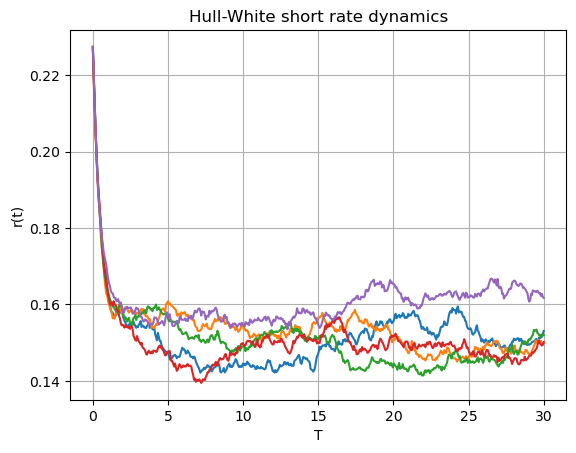

In [43]:
t = jnp.linspace(0, T, N_steps)
plt.plot(t, r[:5, :].T)
plt.title('Hull-White short rate dynamics')
plt.xlabel('T')
plt.ylabel('r(t)')
plt.grid()
plt.show()

Given short-rate paths we can estimate ZCB prices. They should be equal to those that are implied by ZCYC.

$P(0, T) = \mathbb{E}_Q\left[e^{-\int_0^T r(s)ds} |\mathcal{F}_0\right]
\approx \frac{1}{N_{paths}}\sum\limits_{i = 1}^{N_{paths}}e^{-\int_0^T r_i(s)ds}$

In [44]:
@jax.jit
def compute_int(r, t):
    return jax.scipy.integrate.trapezoid(r, t)

#vectorized computation of integrals
integrals = jax.vmap(compute_int, in_axes=(0, None))

zcb_prices = jnp.zeros_like(maturities)

for i, T in enumerate(maturities):
    r = get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key)
    t = jnp.linspace(0, T, N_steps)
    tmp = integrals(r, t)
    
    zcb_prices = zcb_prices.at[i].set(jnp.mean(jnp.exp(-tmp)))

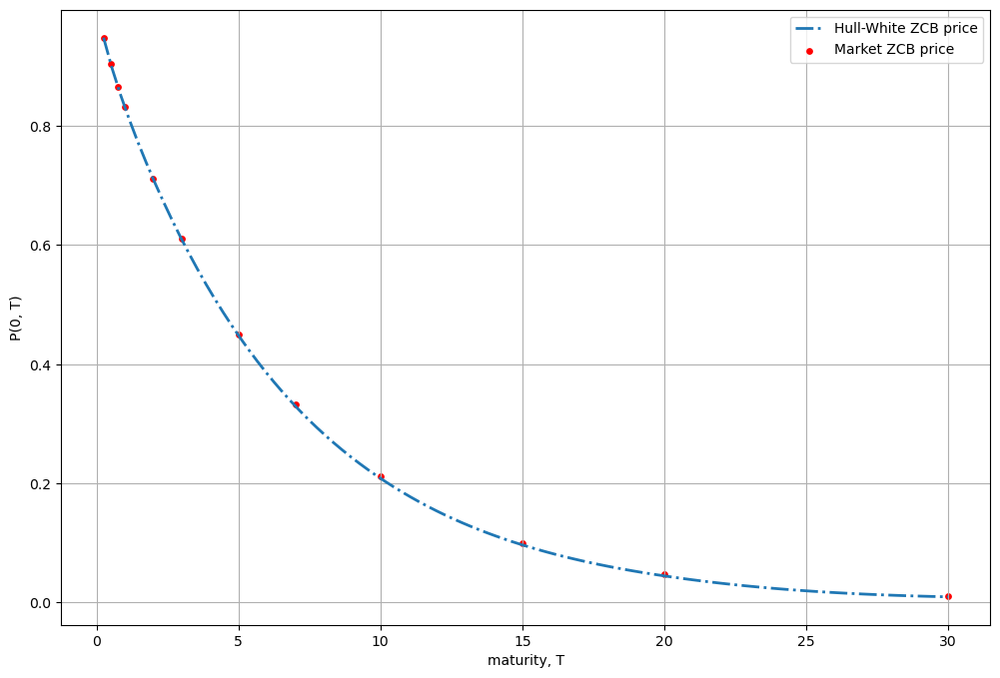

In [45]:
P_hw_spline = create_cubic_spline_interpolator(maturities, zcb_prices)


plt.figure(figsize = (12, 8))
plt.plot(x, P_hw_spline(x), label = 'Hull-White ZCB price', lw = 2, ls = '-.')
plt.scatter(maturities, jnp.exp(-yields*maturities), s = 15, c = 'red', label = 'Market ZCB price')
plt.xlabel('maturity, T')
plt.ylabel('P(0, T)')
plt.grid()
plt.legend()

One can observe that calibrated Hull-White model correctly reproduce ZCB prices and thus can be used to price IR derivatives.

# RNN Time-Series inference

The goal of this section is to train time-series predictive model using RNN.

The model will predict the next value in the sequence based on $L$ previous observations.

The dataset contains hourly energy consumption.

In [53]:
from sklearn.preprocessing import StandardScaler
import copy
from torch import nn
from torch.utils.data import DataLoader, Dataset, TensorDataset
from sklearn.model_selection import train_test_split


In [38]:
import kagglehub
path = kagglehub.dataset_download("robikscube/hourly-energy-consumption")

In [49]:
AEP = pd.read_csv(path + '/AEP_hourly.csv')
AEP = AEP.rename(columns = {'AEP_MW' : 'MW'})
AEP

,Datetime,MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0
...,...,...
121268,2018-01-01 20:00:00,21089.0
121269,2018-01-01 21:00:00,20999.0
121270,2018-01-01 22:00:00,20820.0
121271,2018-01-01 23:00:00,20415.0


The dataset contains multiple entries for the same date (duplicates), each with different energy consumption values. To create a clean, single-value-per-day time series, we aggregate duplicates by taking the mean consumption per date.

Also we change data format to UNIX timestamp, to be able to use it as a predictor.

In [50]:
unique, count = np.unique(AEP['Datetime'].values, return_counts=True)

print(np.unique(count, return_counts=True)) ##There is 4 dates that are presented twice into data

print('repeated dates:',  unique[np.where(count == 2)]) #Repeated dates


#Substitute duplicates with mean
for item in unique[np.where(count == 2)[0]]:
    idx = np.where(AEP['Datetime'] == item)[0]
    mw_mean = np.mean(AEP.iloc[idx, 1])
    AEP.iloc[idx[0], 1] = mw_mean
    AEP = AEP.drop(idx[1])
    AEP.reset_index(drop = True, inplace=True)

(array([1, 2]), array([121265,      4]))
repeated dates: ['2014-11-02 02:00:00' '2015-11-01 02:00:00' '2016-11-06 02:00:00'
 '2017-11-05 02:00:00']


In [51]:
#unix time creation and datasort
AEP['unix_time'] = pd.to_datetime(AEP['Datetime'])
AEP['unix_time'] = AEP['unix_time'].apply(lambda s: int(s.timestamp()))

AEP = AEP.sort_values('unix_time')
AEP = AEP.reset_index(drop = True)

AEP

,Datetime,MW,unix_time
0,2004-10-01 01:00:00,12379.0,1096592400
1,2004-10-01 02:00:00,11935.0,1096596000
2,2004-10-01 03:00:00,11692.0,1096599600
3,2004-10-01 04:00:00,11597.0,1096603200
4,2004-10-01 05:00:00,11681.0,1096606800
...,...,...,...
121264,2018-08-02 20:00:00,17673.0,1533240000
121265,2018-08-02 21:00:00,17303.0,1533243600
121266,2018-08-02 22:00:00,17001.0,1533247200
121267,2018-08-02 23:00:00,15964.0,1533250800


Eventually that is how the dataset looks like.

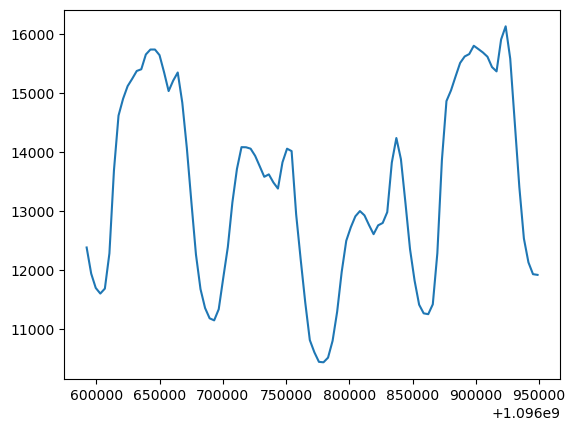

In [52]:
#data plotting
plt.plot(AEP['unix_time'].values[:100], AEP['MW'].values[:100])

To ensure a realistic evaluation of a model, the test set should be constructed as large, continuous segments of the timeline—unseen during training—to evaluate the model’s ability to generalize.

In [141]:
def create_dataloaders(x_data, y_data, L, batch_size, train_size = 0.8):
    test_size  = 1 - train_size

    num = x_data.size - L #Total number of possible sequences
    x_tmp = np.zeros((num, L))
    y_tmp = np.zeros((num, L))
    target_tmp = np.zeros(num)
    for i in range(num):
        x_tmp[i, :] = x_data[i:i+L]
        y_tmp[i, :] = y_data[i:i+L]
        target_tmp[i] = y_data[i+L]

    #Scaling the data
    x_scaler = StandardScaler().fit(x_tmp)
    y_scaler = StandardScaler().fit(y_tmp)
    target_scaler = StandardScaler().fit(target_tmp.reshape(-1, 1))

    x_tmp = x_scaler.transform(x_tmp, copy = True)
    y_tmp = y_scaler.transform(y_tmp, copy = True)
    target_tmp = target_scaler.transform(target_tmp.reshape(-1, 1), copy = True)

    x_tmp = torch.tensor(x_tmp , dtype = torch.float32)
    y_tmp = torch.tensor(y_tmp , dtype = torch.float32)


    X = torch.stack((x_tmp, y_tmp), dim = 2)
    Y = torch.tensor(target_tmp, dtype = torch.float32)
    
    #Creating appropriate test set;
    index = np.arange(num)
    sub_seq = 10*L 
    test_index = np.arange(0, num - sub_seq, num//100) 
    for item in test_index:
        test_index = np.concatenate((test_index, np.arange(item+1, item+1+sub_seq, 1)))

    train_index = np.delete(index, test_index)
    X_train, Y_train = X[train_index], Y[train_index]
    X_test, Y_test = X[test_index], Y[test_index]

    
    train_dataset = TensorDataset(X_train, Y_train)
    test_dataset = TensorDataset(X_test, Y_test)
    train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
    test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)



    return x_scaler, y_scaler , target_scaler, train_dataloader, test_dataloader

In [199]:
L = 17 #L - window lenght
batch_size = 400

x = copy.deepcopy(AEP['unix_time'].values)
y = copy.deepcopy(AEP['MW'].values)

x_scaler, y_scaler, target_scaler,  train_dataloader,  test_dataloader = create_dataloaders(x, y, L, batch_size)

The model: 3 stacked RNN, with hidden_size = 25 and dropout regularization;

In [200]:
X_tmp, Y_tmp = next(iter(train_dataloader))

input_size = X_tmp.shape[-1]
hidden_size = 25
num_layers = 3

class myRNN(nn.Module):
    
    def __init__(self, hidden_size = hidden_size, input_size=input_size, output_size=1):
        super().__init__()
        self.rnn = nn.RNN(input_size = input_size, hidden_size = hidden_size, num_layers = num_layers,
             nonlinearity = 'tanh', bias = True, batch_first = True, dropout = 0.2)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x, h = None):
        output , _ = self.rnn(x, h)
        out = self.fc(output[:, -1, :])
        return out

In [201]:
learning_rate = 0.01
epochs = 50

model = myRNN()
device = 'cuda'
model.to(device)

loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [202]:
def train_loop(dataloader, model, loss_fn, optimizer):
    model.train()
    j = 0
    cum_loss = .0
    
    for batch, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)
        pred = model(X).to(device)
        loss = loss_fn(pred, y).to(device)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        
        
        
        if batch % 50 == 0:
            j+=1
            loss, current = loss.item(), batch * batch_size + len(X)
            cum_loss += loss
            print(f"batch {batch} loss: {loss:.5}")
            
    print(f'mean train loss : {cum_loss/j:.5}', )            
    return cum_loss/j

def test_loop(dataloader, model, loss_fn):
    model.eval()
    size = len(dataloader)
    loss = .0

    with torch.no_grad():
        for (X, y) in dataloader:
            X = X.to(device)
            y = y.to(device)
            pred = model(X).to(device)
            loss += loss_fn(pred, y).to(device)


        
    print(f'test loss: {loss/size:.5}')
    return float(loss/size)

In [203]:
train_losses = list()
test_losses = list()
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_losses.append(train_loop(train_dataloader, model, loss_fn, optimizer))
    test_losses.append(test_loop(test_dataloader, model, loss_fn))
print("Done!")

Epoch 1
-------------------------------
batch 0 loss: 1.0491
batch 50 loss: 0.041036
batch 100 loss: 0.030225
batch 150 loss: 0.031672
batch 200 loss: 0.022004
batch 250 loss: 0.031873
mean train loss : 0.20098
test loss: 0.016166
Epoch 2
-------------------------------
batch 0 loss: 0.023981
batch 50 loss: 0.020337
batch 100 loss: 0.017042
batch 150 loss: 0.018811
batch 200 loss: 0.019856
batch 250 loss: 0.017149
mean train loss : 0.019529
test loss: 0.011843
Epoch 3
-------------------------------
batch 0 loss: 0.017372
batch 50 loss: 0.021677
batch 100 loss: 0.017976
batch 150 loss: 0.017053
batch 200 loss: 0.017728
batch 250 loss: 0.015466
mean train loss : 0.017879
test loss: 0.011342
Epoch 4
-------------------------------
batch 0 loss: 0.01841
batch 50 loss: 0.015196
batch 100 loss: 0.016061
batch 150 loss: 0.015532
batch 200 loss: 0.015753
batch 250 loss: 0.014448
mean train loss : 0.0159
test loss: 0.0094187
Epoch 5
-------------------------------
batch 0 loss: 0.014627
batch 

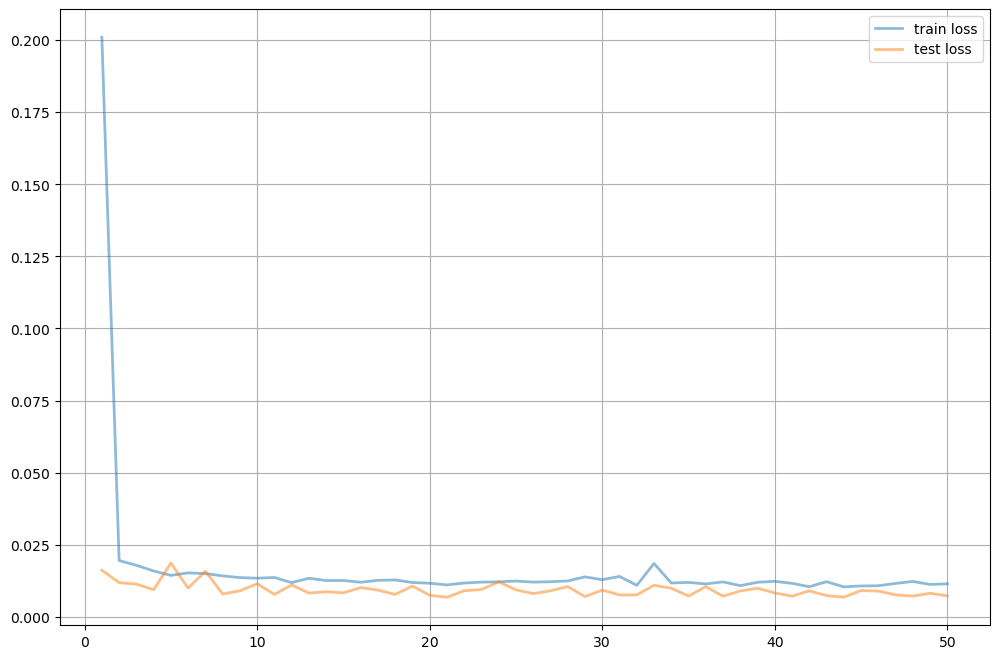

In [204]:
plt.figure(figsize = (12, 8))
plt.plot(np.arange(1, epochs + 1), np.array(train_losses), label = 'train loss', lw = 2, alpha = 0.5)
plt.plot(np.arange(1, epochs + 1), np.array(test_losses), label = 'test loss', lw = 2, alpha = 0.5)
plt.legend()
plt.grid()

To evaluate model we plot its predictions on training sample:

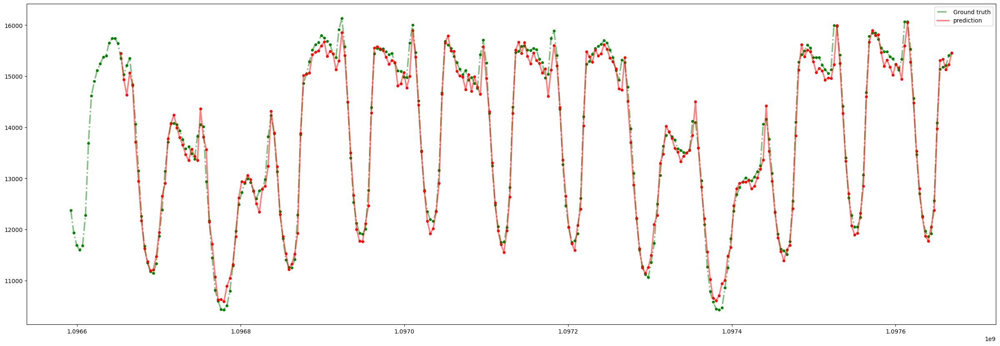

In [205]:
model.to('cpu')

num = 300

y_pred= copy.deepcopy(y)

i = L #index of the time step to be inferred

while i!= num-1:
    x_scaled = x_scaler.transform(x[i-L: i].reshape(1, -1), copy = True)
    y_scaled = y_scaler.transform(y[i-L: i].reshape(1, -1), copy = True)

    x_scaled = torch.tensor(x_scaled, dtype = torch.float32)
    y_scaled = torch.tensor(y_scaled, dtype = torch.float32)

    X = torch.stack((x_scaled, y_scaled), dim = 2)

    y_pred_scaled = np.array(model(X).detach()).reshape(-1, 1)
    y_pred[i] = target_scaler.inverse_transform(y_pred_scaled, copy = True)[0, 0]
    i += 1


plt.figure(figsize = (30, 10))
plt.plot(x[:num], y[:num], c = 'green', ls = '-.', alpha = 0.5, lw = 2.5, label = 'Ground truth')
plt.scatter(x[:num], y[:num], c = 'green',  s = 15)
plt.plot(x[L:num], y_pred[L:num], c = 'red', alpha = 0.5, lw = 2.5, label = 'prediction')
plt.scatter(x[L:num], y_pred[L:num], c = 'red', s = 15)
plt.legend()
plt.show()

Out of sample performance. Here not every sequence is consecutive.

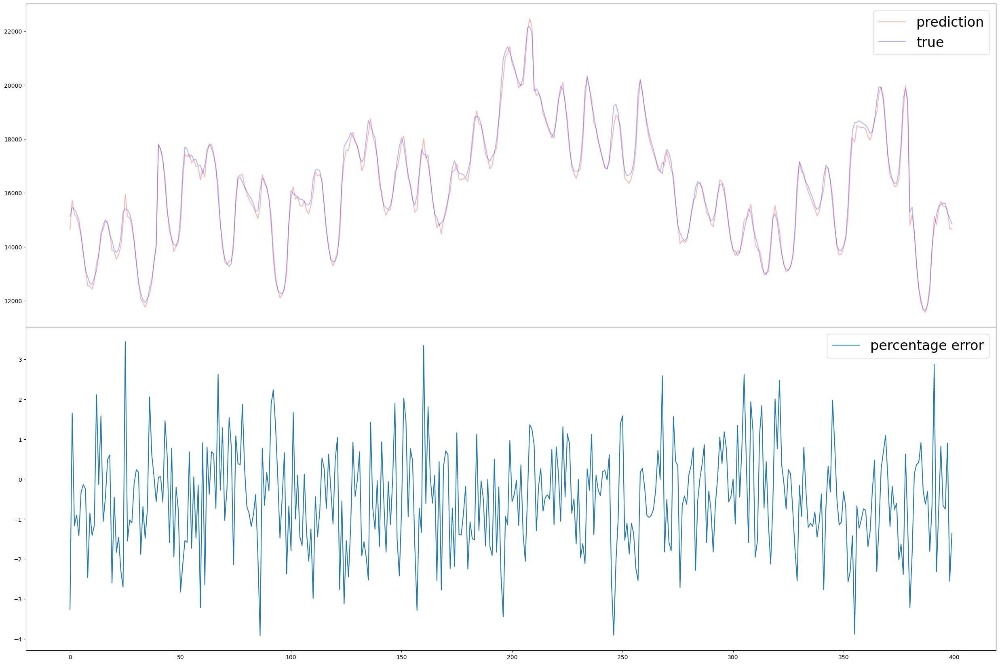

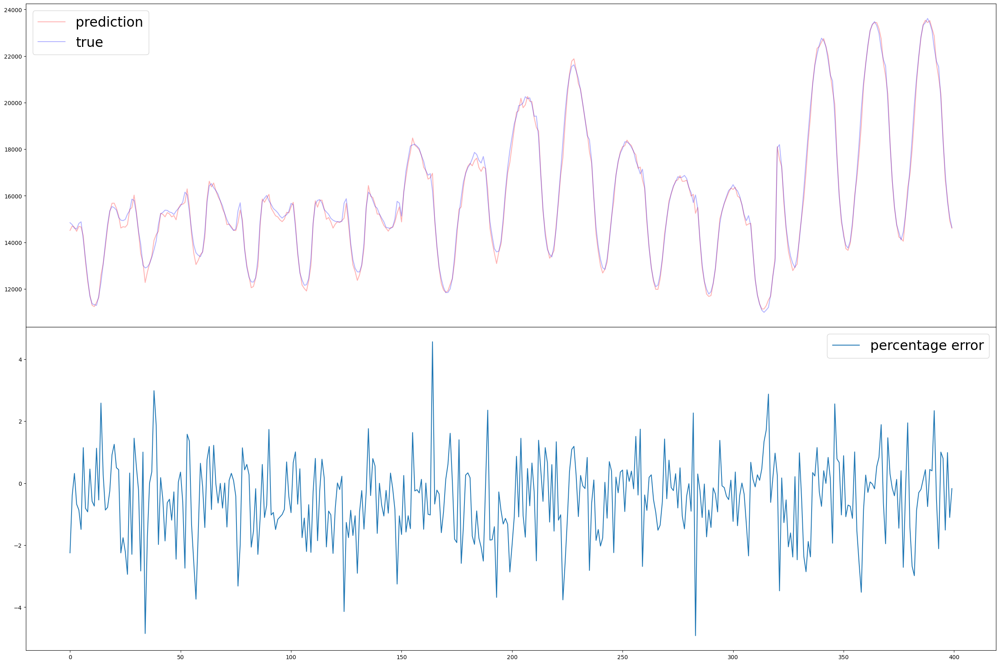

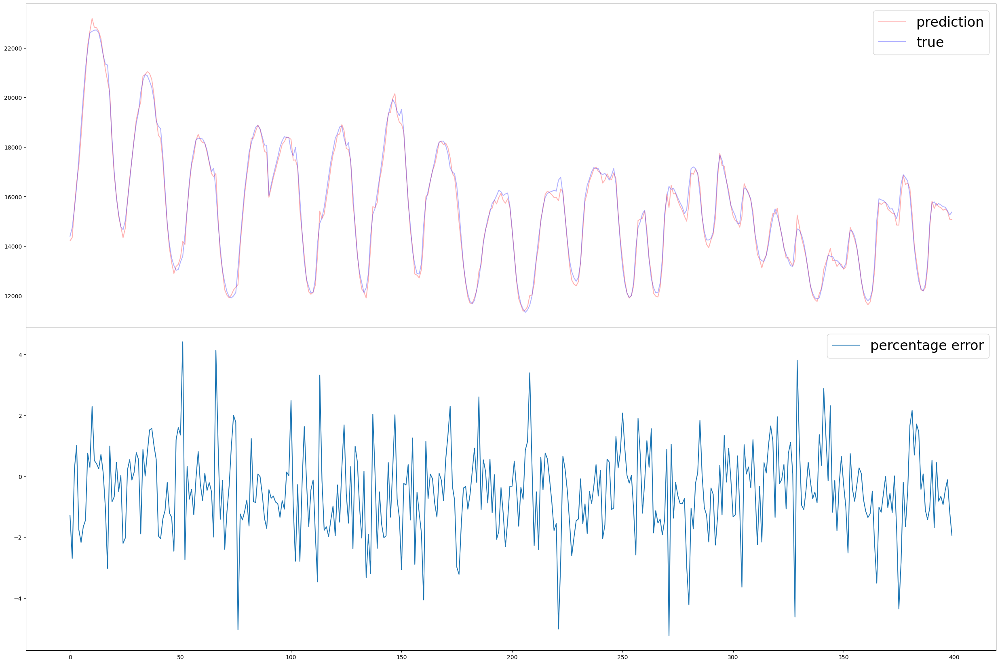

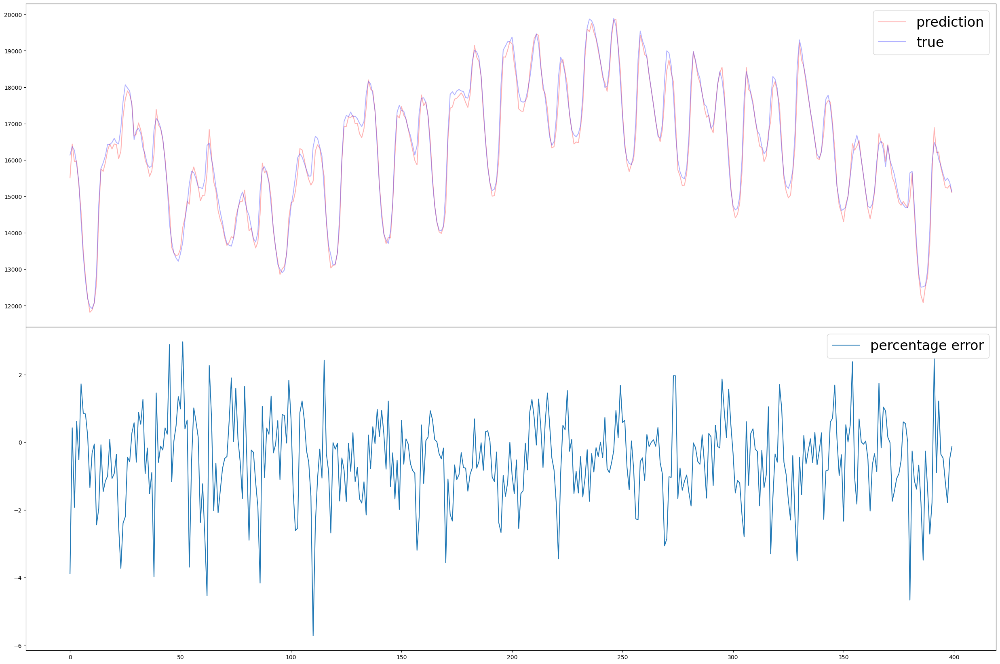

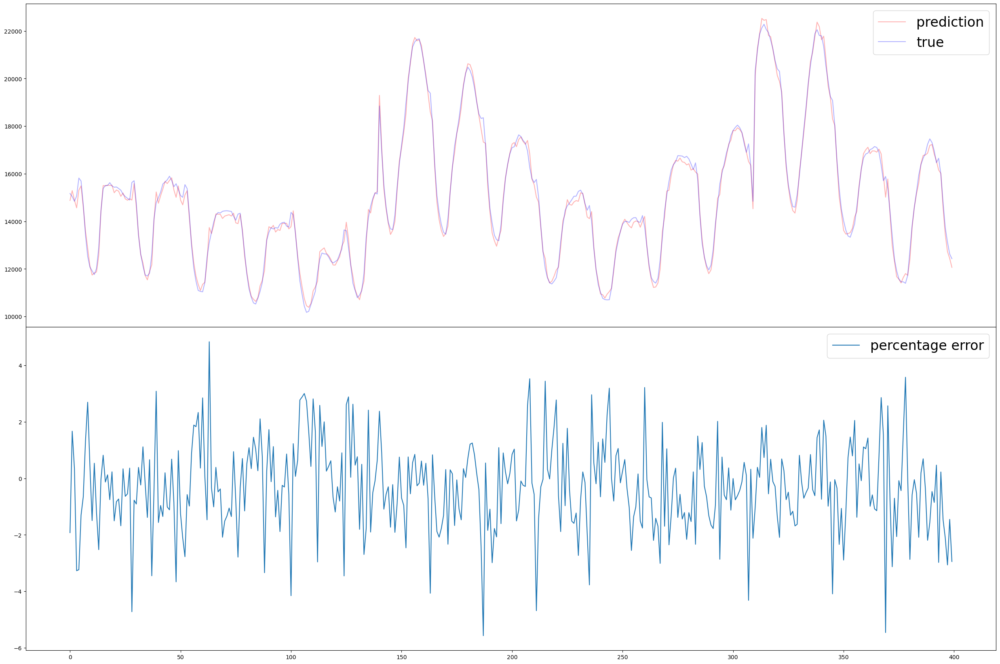

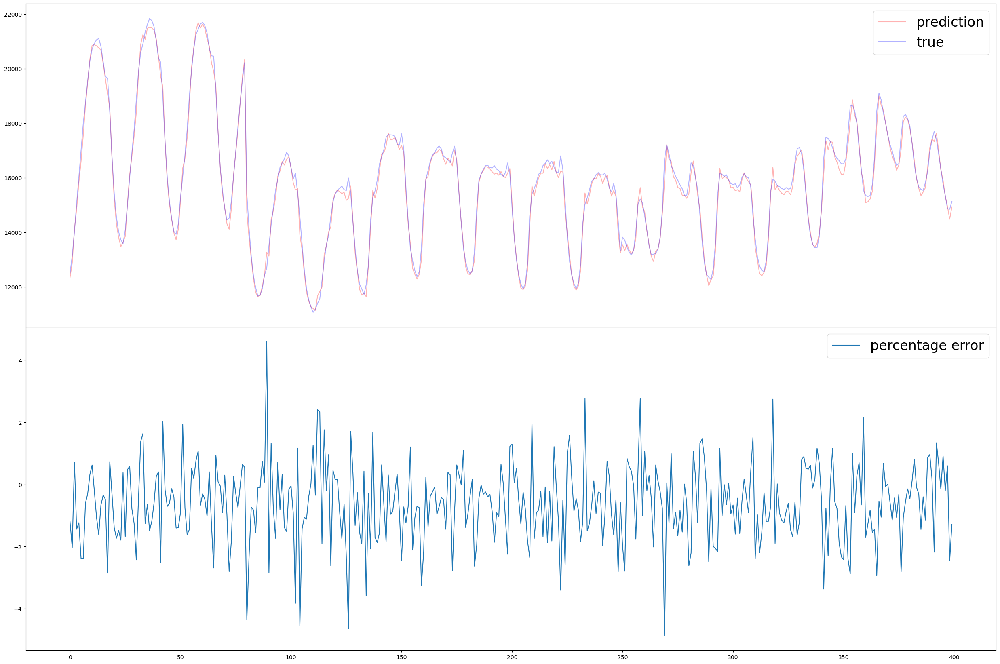

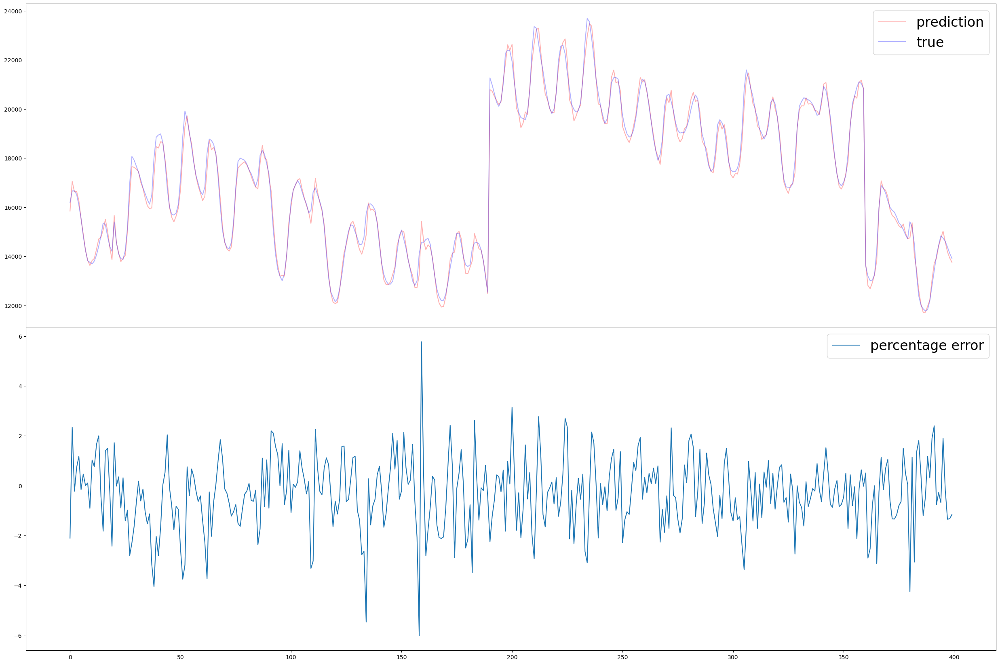

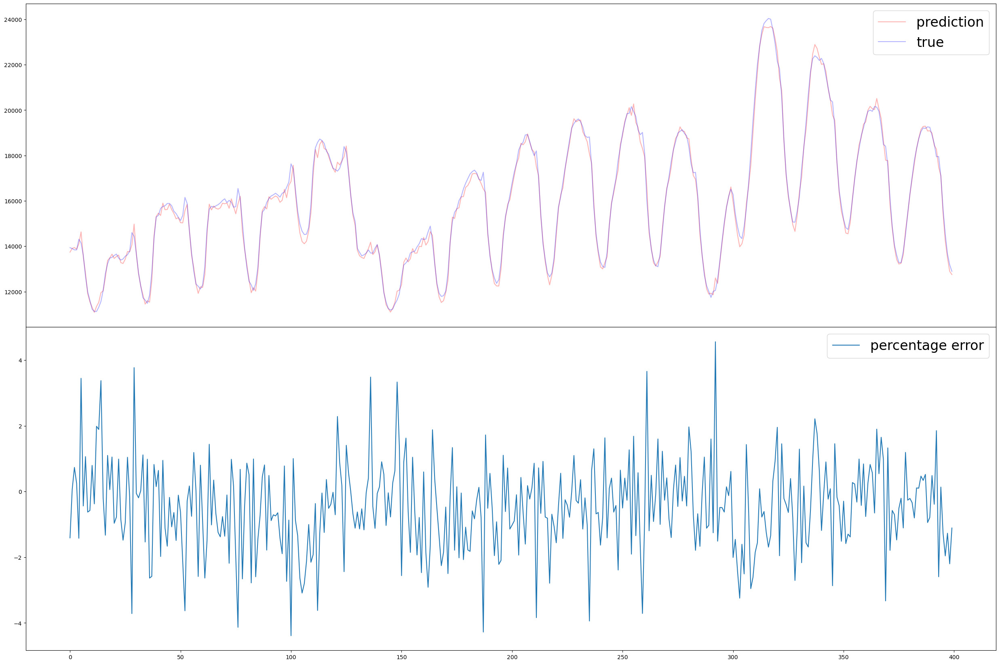

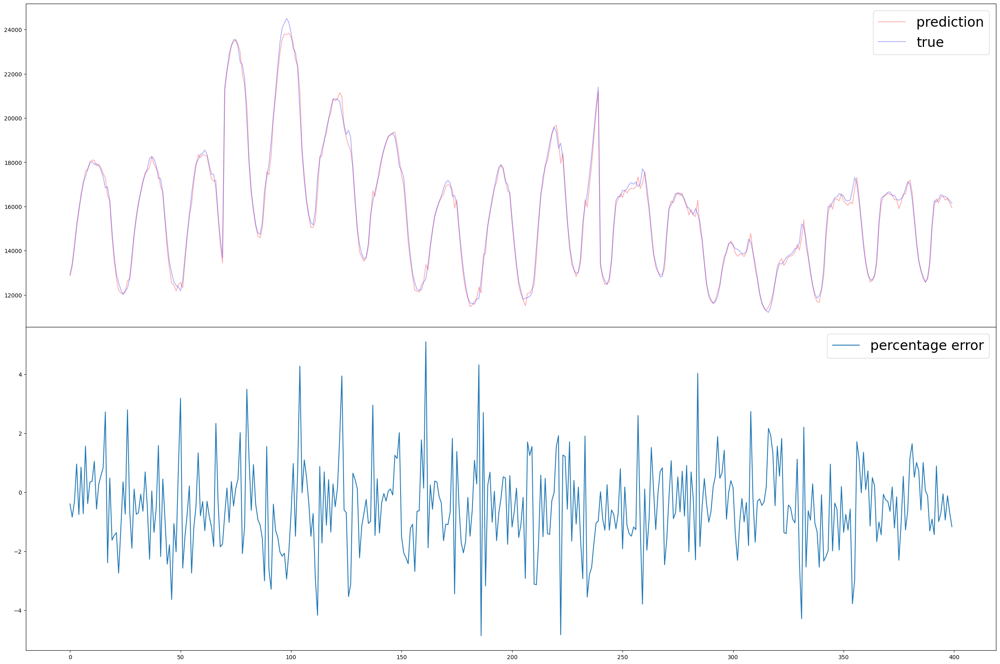

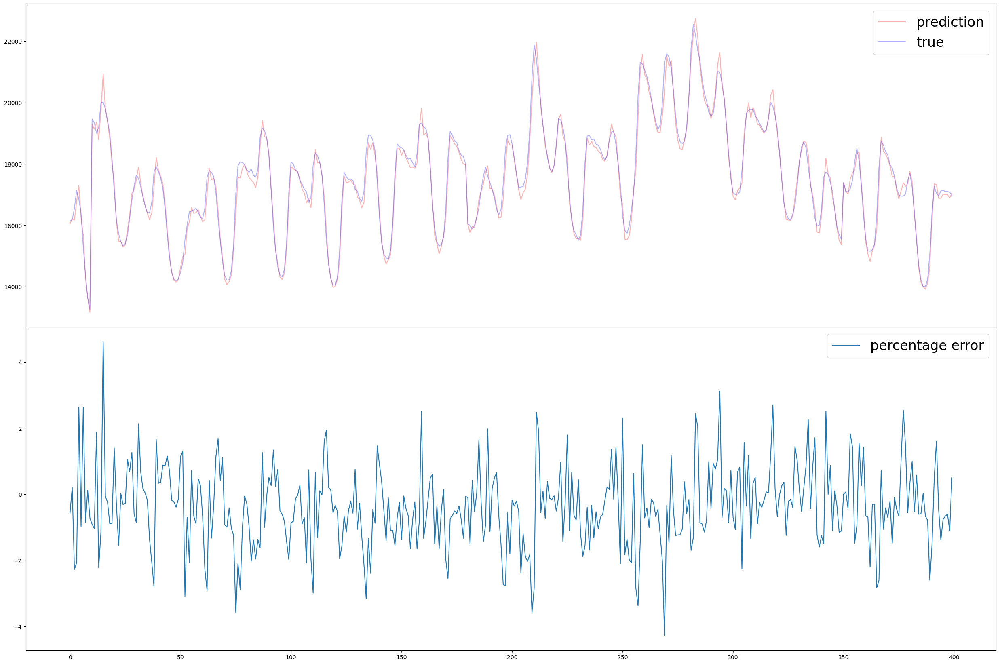

In [206]:
iterable = iter(test_dataloader)
next(iterable)
for _ in range(10):
    X_tmp, Y_tmp = next(iterable)
    X_tmp = X_tmp[:batch_size, :, :]
    Y_tmp = Y_tmp[:batch_size, :]
    y_hat = target_scaler.inverse_transform(model(X_tmp).detach())
    y_true = target_scaler.inverse_transform(Y_tmp.detach())
    fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (30, 20), sharex = True)
    plt.subplots_adjust(
    left=0.1,      # Left margin
    right=0.9,     # Right margin
    bottom=0.1,    # Bottom margin
    top=0.9,       # Top margin
    wspace=0.4,    # Horizontal space between subplots
    hspace=0.0001     # Vertical space between subplots
)
    axs[0].plot(y_hat, alpha = 0.3, label = 'prediction', c = 'red')
    axs[0].plot(y_true, c = 'blue', label = 'true', alpha = 0.3 )
    axs[1].plot((y_hat-y_true)/y_true*100, label = 'percentage error' )
    axs[0].legend(fontsize = 24)
    axs[1].legend(fontsize = 24)
    print('\n', '\n')
    plt.show()